<div style='background-color:#0071dc;text-align: center;padding:10px;'>
    <h1 style='color:white; font-family: Verdana'> <img alt='Walmart' src='https://i5.wal.co/dfw/63fd9f59-b3e1/7a569e53-f29a-4c3d-bfaf-6f7a158bfadd/v1/walmartLogo.svg'> Store Sales Forecasting </h1>
</div>

<h2 style='color:#ffc220; font-family: Verdana'> Imports </h2>

In [1]:
from os import listdir
from os.path import isfile, join

In [2]:
import zipfile
import time

In [3]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
from scipy.stats import randint, loguniform

import matplotlib.pyplot as plt
import plotly.express as px
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go
init_notebook_mode(connected=True)
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

In [4]:
import shap

In [5]:
import datetime

<h2 style='color:#ffc220; font-family: Verdana'> Reading the files </h2>

<span style='color:#0071dc; font-family: Verdana'> Looping over all provided files. <span>

In [6]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/walmart-recruiting-store-sales-forecasting/train.csv.zip
/kaggle/input/walmart-recruiting-store-sales-forecasting/sampleSubmission.csv.zip
/kaggle/input/walmart-recruiting-store-sales-forecasting/stores.csv
/kaggle/input/walmart-recruiting-store-sales-forecasting/features.csv.zip
/kaggle/input/walmart-recruiting-store-sales-forecasting/test.csv.zip


In [7]:
filespath=r'/kaggle/input/walmart-recruiting-store-sales-forecasting/'

In [8]:
files_list = [f for f in listdir(filespath) if isfile(join(filespath, f))]
print(files_list)

['train.csv.zip', 'sampleSubmission.csv.zip', 'stores.csv', 'features.csv.zip', 'test.csv.zip']


In [9]:
dict_dfs={}
for file in files_list:
    if 'zip' in file:
        with zipfile.ZipFile(join(filespath, file),'r') as z:
            print(file)
            dict_dfs[file.split('.')[0]]=pd.read_csv(z.open('.'.join(file.split('.')[:2])))
    else:
        print(file)
        dict_dfs[file.split('.')[0]]=pd.read_csv(join(filespath, file))

train.csv.zip
sampleSubmission.csv.zip
stores.csv
features.csv.zip
test.csv.zip


In [10]:
for name in dict_dfs:
    print(name)
    print(dict_dfs[name].head(),'\n')

train
   Store  Dept        Date  Weekly_Sales  IsHoliday
0      1     1  2010-02-05      24924.50      False
1      1     1  2010-02-12      46039.49       True
2      1     1  2010-02-19      41595.55      False
3      1     1  2010-02-26      19403.54      False
4      1     1  2010-03-05      21827.90      False 

sampleSubmission
               Id  Weekly_Sales
0  1_1_2012-11-02             0
1  1_1_2012-11-09             0
2  1_1_2012-11-16             0
3  1_1_2012-11-23             0
4  1_1_2012-11-30             0 

stores
   Store Type    Size
0      1    A  151315
1      2    A  202307
2      3    B   37392
3      4    A  205863
4      5    B   34875 

features
   Store        Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0      1  2010-02-05        42.31       2.572        NaN        NaN   
1      1  2010-02-12        38.51       2.548        NaN        NaN   
2      1  2010-02-19        39.93       2.514        NaN        NaN   
3      1  2010-02-26        46.63  

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Two core datasets with weekly sales one for training one for testing.</li>
        <li>Features dataset to merge and bring extra row features.</li>
        <li>One stores dataset containing features per store number.</li>
    </ul>
</span>
<h5 style='color:gray; font-family: Verdana'>Decision here to try merging both feature datasets with both train and test datasets.</h5>

<h2 style='color:#ffc220; font-family: Verdana'> Exploratory Data Analysis </h2>

<h3 style='color:#0071dc; font-family: Verdana'> Merge with extra features dataset </h3>

<span style='color:#0071dc; font-family: Verdana'> Can the Features dataset be joined with train and test csv ? <span>

In [11]:
df_trainoteste=pd.DataFrame(pd.concat([dict_dfs['train'],
dict_dfs['test']]))
df_trainoteste=pd.DataFrame(df_trainoteste.drop_duplicates(['Date','Store']).Date.str[2:7])
df_trainoteste['dataset']='Treino_e_teste'
df_featuresdates=pd.DataFrame(dict_dfs['features'].Date.str[2:7])
df_featuresdates['dataset']='Features'

In [12]:
dfplotdatas=pd.concat([df_trainoteste,df_featuresdates])

In [13]:
dfplotdatas=dfplotdatas.groupby(['Date','dataset'],as_index=False).agg(Date=('Date','last'),Count=('Date','count'),dataset=('dataset','last'))

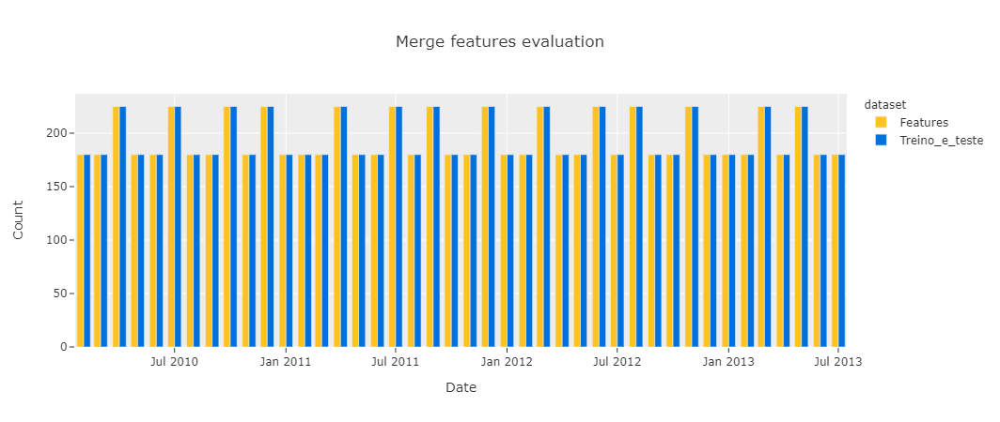

In [14]:
dfplotdatas.plot.bar(x='Date',y='Count',template='ggplot2',color="dataset",barmode='group',title='Merge features evaluation', color_discrete_sequence=["#ffc220", "#0071dc"],backend='plotly')

<span style='color:gray; font-family: Verdana'> By looking at date ranges for all the data sets we want to merge, the features data set has the necessary dates to merge withouts missings. <span>

<span style='color:#0071dc; font-family: Verdana'> Looking for the keys to join the datasets <span>

In [15]:
dict_dfs['features'].head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [16]:
dict_dfs['test'].head()

,Store,Dept,Date,IsHoliday
0,1,1,2012-11-02,False
1,1,1,2012-11-09,False
2,1,1,2012-11-16,False
3,1,1,2012-11-23,True
4,1,1,2012-11-30,False


<span style='color:gray; font-family: Verdana'> Found both store and Date as keys to use to join. <span>

In [17]:
dict_dfs['test']=dict_dfs['test'].merge(dict_dfs['features'],how='left',on=['Store','Date'])

In [18]:
dict_dfs['train']=dict_dfs['train'].merge(dict_dfs['features'],how='left',on=['Store','Date'])

<span style='color:#0071dc; font-family: Verdana'> Seeing if the IsHoliday feature that repeat in both datasets are the same <span>

In [19]:
dict_dfs['train'][dict_dfs['train']['IsHoliday_x']!=dict_dfs['train']['IsHoliday_y']]

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y


In [20]:
dict_dfs['test'][dict_dfs['test']['IsHoliday_x']!=dict_dfs['test']['IsHoliday_y']]

,Store,Dept,Date,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday_y


<span style='color:gray; font-family: Verdana'> IsHoliday is the same in both datasets, so one of the columns need to be droped <span>

In [21]:
dict_dfs['test']=dict_dfs['test'].drop('IsHoliday_y',axis=1)

In [22]:
dict_dfs['test']=dict_dfs['test'].rename(columns={'IsHoliday_x':'IsHoliday'})

In [23]:
dict_dfs['train']=dict_dfs['train'].drop('IsHoliday_y',axis=1)

In [24]:
dict_dfs['train']=dict_dfs['train'].rename(columns={'IsHoliday_x':'IsHoliday'})

<h3 style='color:#0071dc; font-family: Verdana'> Merge with extra store features </h3>

In [25]:
dict_dfs['stores'].head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [26]:
dict_dfs['train']=dict_dfs['train'].merge(dict_dfs['stores'],how='left',on='Store')

In [27]:
dict_dfs['test']=dict_dfs['test'].merge(dict_dfs['stores'],how='left',on='Store')

<h3 style='color:#0071dc; font-family: Verdana'> Sales evaluations </h3>

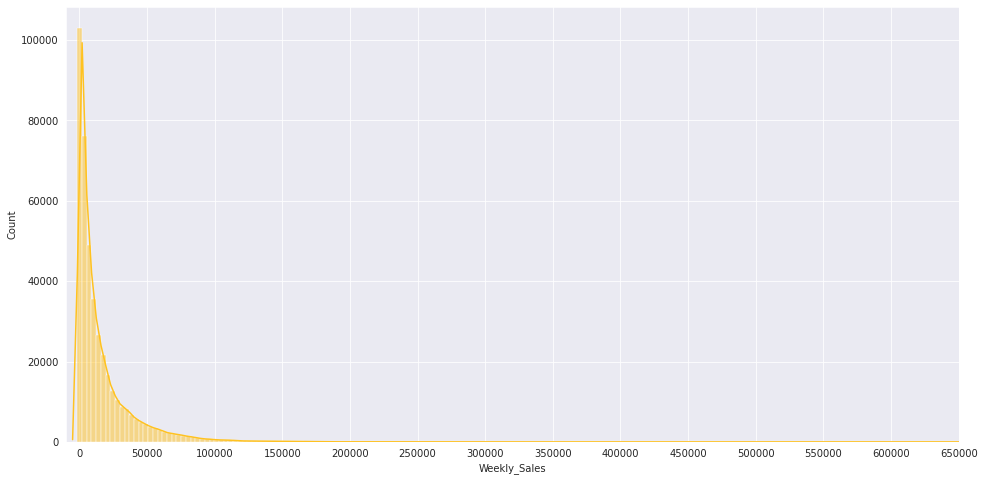

In [28]:
fig,ax=plt.subplots(figsize=(16, 8))
sns.histplot(dict_dfs['train']['Weekly_Sales'], color='#ffc220', bins=200,ax=ax,kde=True)
ax.set_xticks([i for i in range(0,700000,50000)])
ax.set_xlim([-10000,650000])
plt.show()

<span style='color:gray; font-family: Verdana'> Weekly sales are accumulated under 50k. <span>

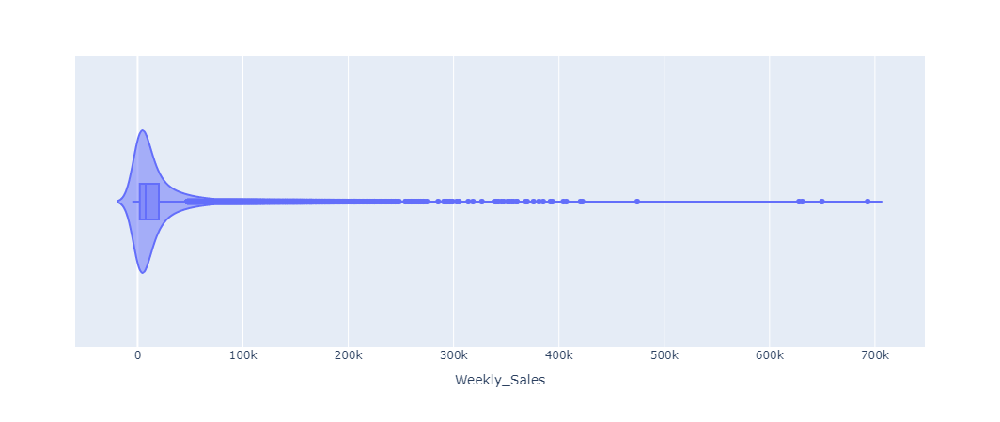

In [29]:
px.violin(dict_dfs['train'],x='Weekly_Sales', box=True)

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Weekly sales median is around 7500. </li>
        <li>Odd behavior of negative weekly sales, but with very low volume of events. </li>
        <li>Weekly Sales indeed accumulated on low values, with some outliers.</li>
    </ul>
<span>

<span style='color:#0071dc; font-family: Verdana'> Evaluating sales behavior over the year. <span>

In [30]:
dfplot=dict_dfs['train']
dfplot['Week']=pd.to_datetime(dfplot.Date).dt.isocalendar().week
dfplot['Year']=pd.to_datetime(dfplot.Date).dt.isocalendar().year

In [31]:
dfplot=dfplot.groupby(['Week','Year'],as_index=False).Weekly_Sales.mean()

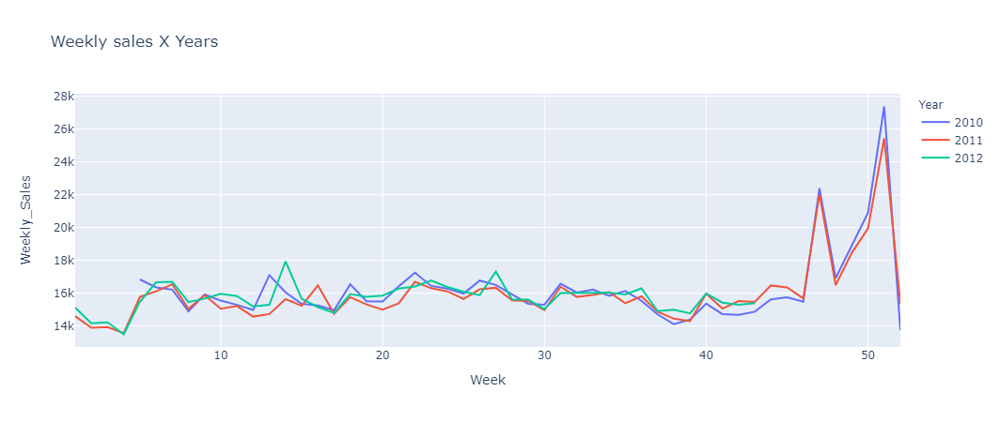

In [32]:
px.line(dfplot.sort_values(['Year','Week']),x='Week',title='Weekly sales X Years',y='Weekly_Sales',color='Year')

<span style='color:gray; font-family: Verdana'>The Weekly_Sales average is similar in all years, so there is no outlier year that we need to worry about..<span>

In [33]:
dfplot=dict_dfs['train']
dfplot['Week']=pd.to_datetime(dfplot.Date).dt.isocalendar().week
dfplot=dfplot.groupby(['Week'],as_index=False).agg(Mean_Weekly_Sales=('Weekly_Sales','mean'))
# dfplot['Group']='Mean_Weekly_Sales'

In [34]:
dfplot2=dict_dfs['train']
dfplot2['Week']=pd.to_datetime(dfplot2.Date).dt.isocalendar().week
dfplot2=dfplot2.groupby(['Week'],as_index=False).agg(Median_Weekly_Sales=('Weekly_Sales','median'))
# dfplot2['Group']='Median_Weekly_Sales'

In [35]:
dfplotf=dfplot.merge(dfplot2,how='left',on='Week')

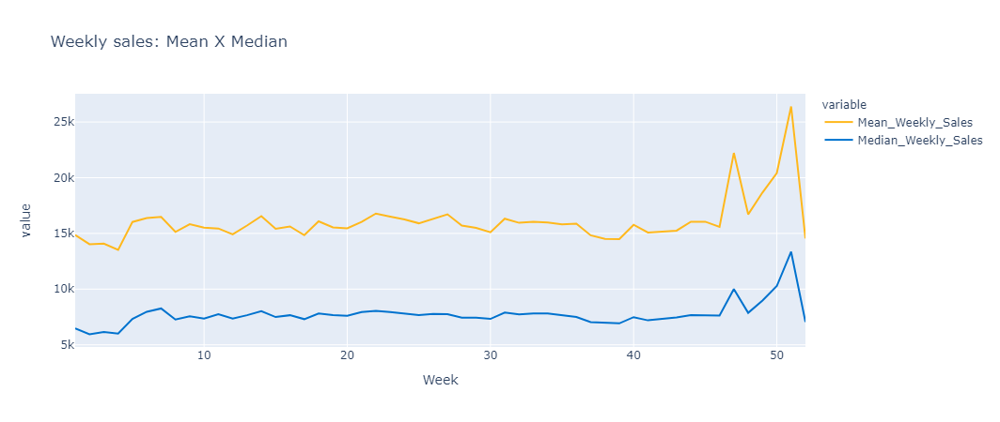

In [36]:
px.line(dfplotf.sort_values(['Week']),x='Week',y=['Mean_Weekly_Sales','Median_Weekly_Sales'],title='Weekly sales: Mean X Median',color_discrete_sequence=['#ffb81c','#0072ce'])

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Mean and Median are distant from each other, that suggests there are some discrepancy between some stores and/or departments.</li>
        <li>Very near the end of the year the sales sky rocket twice, might be because of the holidays.</li>
        <li>Brief time before end of the year peak they actually fall, probably because of people saving to buy at the holidays.</li>
        <li>As the year starts the sales reach rock bottom, maybe because people spent too much on holidays and don't have more money to spend.</li>
    </ul>
   <span>
<h5>Decision here to create week feature to evaluate the holiday weeks and year too match the holidays if they chance by year.</h5>

In [37]:
dict_dfs['train']['Week']=pd.to_datetime(dict_dfs['train'].Date).dt.isocalendar().week
dict_dfs['train']['Year']=pd.to_datetime(dict_dfs['train'].Date).dt.isocalendar().year

In [38]:
dict_dfs['test']['Week']=pd.to_datetime(dict_dfs['test'].Date).dt.isocalendar().week
dict_dfs['test']['Year']=pd.to_datetime(dict_dfs['test'].Date).dt.isocalendar().year

<h3 style='color:#0071dc; font-family: Verdana'> Evaluating features </h3>

<span style='color:#0071dc; font-family: Verdana'> Evaluating column types and counts. <span>

In [39]:
dict_dfs['train'].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
 5   Temperature   421570 non-null  float64
 6   Fuel_Price    421570 non-null  float64
 7   MarkDown1     150681 non-null  float64
 8   MarkDown2     111248 non-null  float64
 9   MarkDown3     137091 non-null  float64
 10  MarkDown4     134967 non-null  float64
 11  MarkDown5     151432 non-null  float64
 12  CPI           421570 non-null  float64
 13  Unemployment  421570 non-null  float64
 14  Type          421570 non-null  object 
 15  Size          421570 non-null  int64  
 16  Week          421570 non-null  UInt32 
 17  Year          421570 non-null  UInt32 
dtypes: U

In [40]:
dict_dfs['train'].describe()

,Store,Dept,Weekly_Sales,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size,Week,Year
count,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000,150681.000000,111248.000000,137091.000000,134967.000000,151432.000000,421570.000000,421570.000000,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123,60.090059,3.361027,7246.420196,3334.628621,1439.421384,3383.168256,4628.975079,171.201947,7.960289,136727.915739,25.826762,2010.968591
std,12.785297,30.492054,22711.183519,18.447931,0.458515,8291.221345,9475.357325,9623.078290,6292.384031,5962.887455,39.159276,1.863296,60980.583328,14.151887,0.796876
min,1.000000,1.000000,-4988.940000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000,34875.000000,1.000000,2010.000000
25%,11.000000,18.000000,2079.650000,46.680000,2.933000,2240.270000,41.600000,5.080000,504.220000,1878.440000,132.022667,6.891000,93638.000000,14.000000,2010.000000
50%,22.000000,37.000000,7612.030000,62.090000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.318780,7.866000,140167.000000,26.000000,2011.000000
75%,33.000000,74.000000,20205.852500,74.280000,3.738000,9210.900000,1926.940000,103.990000,3595.040000,5563.800000,212.416993,8.572000,202505.000000,38.000000,2012.000000
max,45.000000,99.000000,693099.360000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,219622.000000,52.000000,2012.000000


<span style='color:#0071dc; font-family: Verdana'> Evaluating null counts. <span>

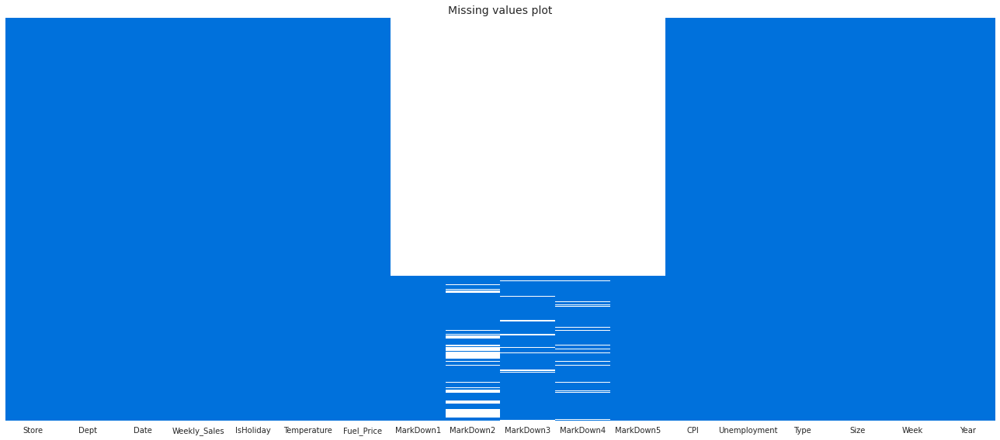

In [41]:
fig,ax=plt.subplots(figsize=(18,8))
sns.heatmap(dict_dfs['train'].sort_values('Date').isna(),ax=ax,cbar=False,yticklabels=False,cmap=['#0071dc','white'])
plt.xticks(rotation=0)
plt.title('Missing values plot',fontdict={'fontsize':14,'fontfamily': 'Verdana'})
plt.tight_layout()
plt.show()

In [42]:
dict_dfs['train'][(dict_dfs['train']['MarkDown1'].isna())&
                  (dict_dfs['train']['MarkDown2'].isna())&
                  (dict_dfs['train']['MarkDown3'].isna())&
                  (dict_dfs['train']['MarkDown4'].isna())&
                  (dict_dfs['train']['MarkDown5'].isna())].Date.str[:7].value_counts().sort_index()

2010-02    11839
2010-03    11788
2010-04    14697
2010-05    11672
2010-06    11661
2010-07    14561
2010-08    11603
2010-09    11724
2010-10    14667
2010-11    11712
2010-12    14755
2011-01    11695
2011-02    11741
2011-03    11813
2011-04    14746
2011-05    11820
2011-06    11723
2011-07    14621
2011-08    11765
2011-09    14761
2011-10    11820
2011-11     2954
Name: Date, dtype: int64

In [43]:
dict_dfs['train'][dict_dfs['train']['MarkDown1'].notna()].Date.min()

'2011-11-11'

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>MarkDown columns have no values before 2011-11-11.</li>
        <li>Only markdown1 and markdown5 have no missing values.</li>
        <li>Markdown2 has a little bit more missings than the others.</li>
    </ul>
    <h5>Decision here might be to drop the markdowns for an MVP, but let's evaluate them further.</h5>
<span>

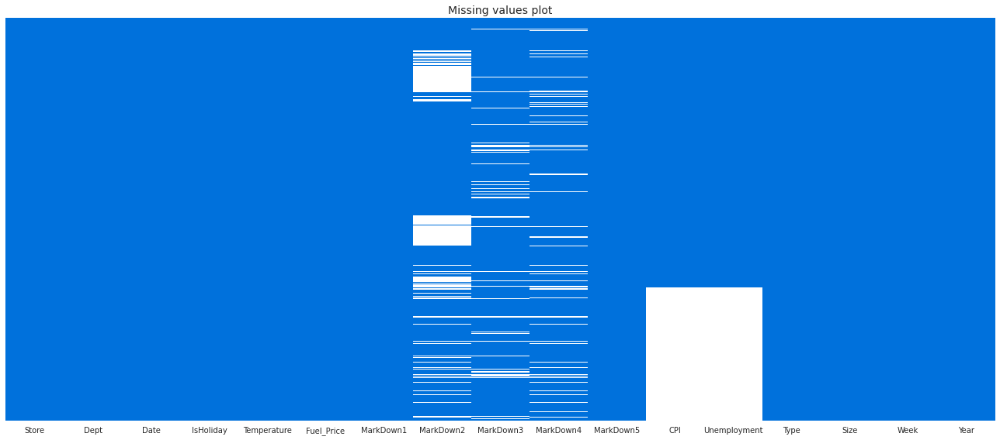

In [44]:
fig,ax=plt.subplots(figsize=(18,8))
sns.heatmap(dict_dfs['test'].sort_values('Date').isna(),ax=ax,cbar=False,yticklabels=False,cmap=['#0071dc','white'])
plt.xticks(rotation=0)
plt.title('Missing values plot',fontdict={'fontsize':14,'fontfamily': 'Verdana'})
plt.tight_layout()
plt.show()

In [45]:
print('Max date without nulls of CPI an Unemployment of the test dataset:',dict_dfs['test'][dict_dfs['test'].CPI.notna()].reset_index().Date.max())
print('Max date of the test dataset:',dict_dfs['test'].Date.max())
print('Percentage of nulls of CPI and Unemployment:',round(dict_dfs['test'][dict_dfs['test'].CPI.isna()].shape[0]*100/dict_dfs['test'].shape[0],2),'%')

Max date without nulls of CPI an Unemployment of the test dataset: 2013-04-26
Max date of the test dataset: 2013-07-26
Percentage of nulls of CPI and Unemployment: 33.17 %


<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>That are a lot of missings of CPI and Unemplyment at the test dataset.</li>
        <li>That are no values of Unemployment and CPI after 26 of April 2013.</li>
    </ul>
<span>
<h5> Because of this quantity of missings of that features it might be suitable to drop them, even more because they have many missings afeter a certain period of time and not just reandom missings over the year so it would be hard to input them with like traditional rolling methods that work very well inputing missings for time series.</h5>

<span style='color:#0071dc; font-family: Verdana'> Evaluating the markdowns. <span>

<span style='color:gray; font-family: Verdana'> Markdowns are events of price reduction, so it is expected that the markdowns affect the sales. <span>

In [46]:
dfplot=dict_dfs['train'][dict_dfs['train'].Date>='2011-11-11'].reset_index(drop=True).copy()
dfplot['Week']=pd.to_datetime(dfplot.Date).dt.isocalendar().week

In [47]:
dfplot=dfplot[['Week','Weekly_Sales','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']].melt(id_vars=["Week"], 
        var_name="Variable", 
        value_name="Value")

In [48]:
dfplot=dfplot.groupby(['Week','Variable'],as_index=False).mean()

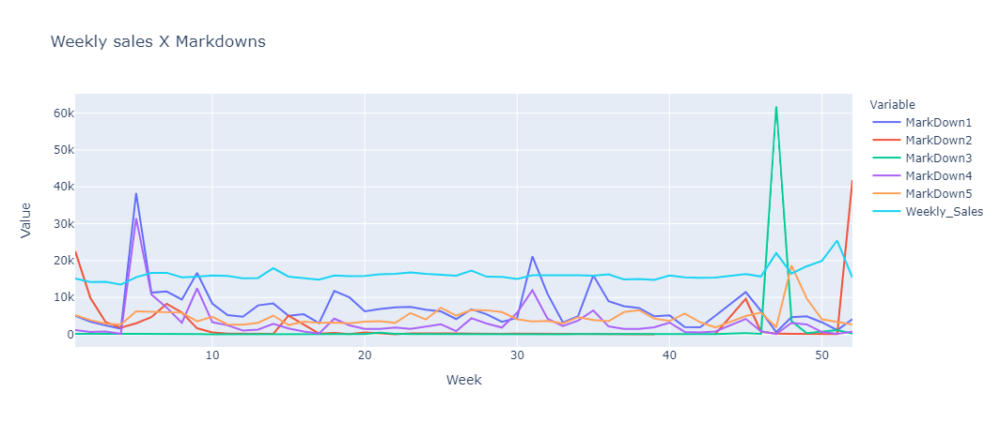

In [49]:
px.line(dfplot.sort_values('Week'),x='Week',title='Weekly sales X Markdowns',y='Value',color='Variable')

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Markdowns usually follows drops in sales, probably because the stores are trying to pump the sales back to the top.</li>
        <li>Shortly after markdowns there are some drops again, likely because people wait to buy on markdowns and than they wait for the next ones.</li>
        <li>Markdown columns affect a little bit the prices as seeing in the graph but the highest impacts are actually near the end of the year and as further evaluation that impact surely come from the holidays.</li>
    </ul>
<span>
<h5> Because Markdowns has too much missings and the strongest correlation that might be there, in fact is not most from this feature, it will be decided to drop them.</h5>

In [50]:
dropmarks=[coluna for coluna in dict_dfs['features'].columns if 'markdown' in coluna.lower()]
dict_dfs['train'].drop(dropmarks,axis=1,inplace=True)
dict_dfs['test'].drop(dropmarks,axis=1,inplace=True)

<span style='color:#0071dc; font-family: Verdana'> Evaluating Holidays. <span>

In [51]:
dict_holidays={'Super Bowl':  ['12-Feb-10', '11-Feb-11', '10-Feb-12', '08-Feb-13'],
'Labor Day':    ['10-Sep-10', '09-Sep-11', '07-Sep-12', '06-Sep-13'],
'Thanksgiving': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13'],
'Christmas':    ['31-Dec-10', '30-Dec-11', '28-Dec-12', '27-Dec-13'],
#Adding relevant Holidays to evaluate their influence on sales
'Valentines Day': ['14-Feb-10', '14-Feb-11', '14-Feb-12', '14-Feb-13'],
'Mothers Day': ['09-May-10', '08-May-11', '13-May-12', '12-May-13'],
'Fathers Day': ['20-Jun-10', '19-Jun-11', '17-Jun-12', '16-Jun-13'],
'Easter': ['04-Apr-10', '24-Apr-11', '08-Apr-12', '31-Mar-13'],
'Black Friday': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13']}

In [52]:
dict_holidays={i:[datetime.datetime.strptime(x,'%d-%b-%y') for x in dict_holidays[i]] for i in dict_holidays.keys()}

In [53]:
dfplot=dict_dfs['train']
dfplot['Week']=pd.to_datetime(dfplot.Date).dt.isocalendar().week
dfplot['Year']=pd.to_datetime(dfplot.Date).dt.isocalendar().year
dfplot['Date']=pd.to_datetime(dfplot.Date)

In [54]:
df_superbowl=pd.DataFrame(dict_holidays['Super Bowl'],columns=['Date']).merge(dfplot.groupby('Date',as_index=False).mean()[['Date','Weekly_Sales']],how='left')
df_laborday=pd.DataFrame(dict_holidays['Labor Day'],columns=['Date']).merge(dfplot.groupby('Date',as_index=False).mean()[['Date','Weekly_Sales']],how='left')
df_thanksgiving=pd.DataFrame(dict_holidays['Thanksgiving'],columns=['Date']).merge(dfplot.groupby('Date',as_index=False).mean()[['Date','Weekly_Sales']],how='left')
df_christmas=pd.DataFrame(dict_holidays['Christmas'],columns=['Date']).merge(dfplot.groupby('Date',as_index=False).mean()[['Date','Weekly_Sales']],how='left')

In [55]:
df_ValentinesDay=pd.DataFrame([[i.isocalendar()[1],i.isocalendar()[0]] for i in dict_holidays['Valentines Day']],columns=['Week','Year']).merge(dfplot.groupby(['Week','Year'],as_index=False).agg({'Date':'last','Weekly_Sales':'mean'})[['Week','Year','Date','Weekly_Sales']],how='left')
df_MothersDay=pd.DataFrame([[i.isocalendar()[1],i.isocalendar()[0]] for i in dict_holidays['Mothers Day']],columns=['Week','Year']).merge(dfplot.groupby(['Week','Year'],as_index=False).agg({'Date':'last','Weekly_Sales':'mean'})[['Week','Year','Date','Weekly_Sales']],how='left')
df_FathersDay=pd.DataFrame([[i.isocalendar()[1],i.isocalendar()[0]] for i in dict_holidays['Fathers Day']],columns=['Week','Year']).merge(dfplot.groupby(['Week','Year'],as_index=False).agg({'Date':'last','Weekly_Sales':'mean'})[['Week','Year','Date','Weekly_Sales']],how='left')
df_Easter=pd.DataFrame([[i.isocalendar()[1],i.isocalendar()[0]] for i in dict_holidays['Easter']],columns=['Week','Year']).merge(dfplot.groupby(['Week','Year'],as_index=False).agg({'Date':'last','Weekly_Sales':'mean'})[['Week','Year','Date','Weekly_Sales']],how='left')
df_BlackFriday=pd.DataFrame([[i.isocalendar()[1],i.isocalendar()[0]] for i in dict_holidays['Black Friday']],columns=['Week','Year']).merge(dfplot.groupby(['Week','Year'],as_index=False).agg({'Date':'last','Weekly_Sales':'mean'})[['Week','Year','Date','Weekly_Sales']],how='left')

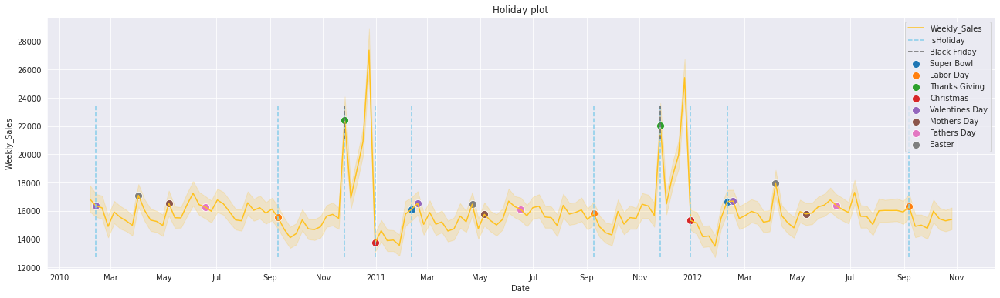

In [56]:
fig,ax=plt.subplots(figsize=(22,6))
sns.lineplot(data=dfplot,x='Date',y='Weekly_Sales',color='#ffc220',ax=ax,label='Weekly_Sales')
ax.set_ylabel('Weekly_Sales')
ax.vlines(dfplot[dfplot.IsHoliday==True].groupby('Date',as_index=False).mean().Date,dfplot[dfplot.IsHoliday==True].groupby('Date',as_index=False).mean().Weekly_Sales.min()-1000,dfplot[dfplot.IsHoliday==True].groupby('Date',as_index=False).mean().Weekly_Sales.max()+1000,label='IsHoliday', linestyles='dashed', color='skyblue')
ax.vlines(df_BlackFriday.Date,df_BlackFriday.Weekly_Sales.min()-1000,df_BlackFriday.Weekly_Sales.max()+1000,label='Black Friday', linestyles='dashed', colors='dimgray')
# sns.scatterplot(data=dfplot[dfplot.IsHoliday==True].groupby('Date',as_index=False).mean(),x='Date',y='Weekly_Sales', marker='o', s=100,label='IsHoliday',ax=ax)
sns.scatterplot(data=df_superbowl,x='Date',y='Weekly_Sales', marker='o', s=100,label='Super Bowl',ax=ax)
sns.scatterplot(data=df_laborday,x='Date',y='Weekly_Sales', marker='o', s=100,label='Labor Day',ax=ax)
sns.scatterplot(data=df_thanksgiving,x='Date',y='Weekly_Sales', marker='o', s=100,label='Thanks Giving',ax=ax)
sns.scatterplot(data=df_christmas,x='Date',y='Weekly_Sales', marker='o', s=100,label='Christmas',ax=ax)
sns.scatterplot(data=df_ValentinesDay,x='Date',y='Weekly_Sales', marker='o', s=100,label='Valentines Day',ax=ax)
sns.scatterplot(data=df_MothersDay,x='Date',y='Weekly_Sales', marker='o', s=100,label='Mothers Day',ax=ax)
sns.scatterplot(data=df_FathersDay,x='Date',y='Weekly_Sales', marker='o', s=100,label='Fathers Day',ax=ax)
sns.scatterplot(data=df_Easter,x='Date',y='Weekly_Sales', marker='o', s=100,label='Easter',ax=ax)
plt.legend()
locator = mdates.AutoDateLocator(minticks=12, maxticks=24)
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
plt.title('Holiday plot')
plt.show()

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>It is possible to notice that at Thanks Giving and Super Bowl that are rises in sales but after that, they plummet.</li>
        <li>Also before Christmas that are huge rises too but at the holiday, they already hit rock bottom different from the other two.</li>
        <li>The only one that doesn not reflect too much on rising sales is Labor Day, but as the other three after the holiday it falls a bit.</li>
        <li>Best insight to focus is that both Thanks Giving and Christmas has a lot of impact on sales.</li>
        <li>All Holidays that appears on IsHoliday are actually in the holliday dates in the exercise description.</li> 
        <li>All Holidays manually added holidays except fathers day are at some peak sales of the month.</li> 
        <li>Black Friday matches Thanks Giving, so no need to add it.</li> 
    </ul>
<span>
    <h5> Decision here to add new holidays except Black Friday and use some kind of flag too see the sales before and after holidays.</h5>

In [57]:
dict_holidays.pop('Black Friday')

[datetime.datetime(2010, 11, 26, 0, 0),
 datetime.datetime(2011, 11, 25, 0, 0),
 datetime.datetime(2012, 11, 23, 0, 0),
 datetime.datetime(2013, 11, 29, 0, 0)]

In [58]:
for holiday in dict_holidays.keys():
    dict_dfs['train'][holiday]=0
    holbefcol=holiday+'_before'
    dict_dfs['train'][holbefcol]=0
    holaftcol=holiday+'_aft'
    dict_dfs['train'][holaftcol]=0
    dfholidaytemp=pd.Series(dict_holidays[holiday]).dt.isocalendar().iloc[:,:2]
    dfholidaytempbef=(pd.Series(dict_holidays[holiday])-pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
    dfholidaytempaft=(pd.Series(dict_holidays[holiday])+pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
    for nmr in range(len(dfholidaytemp)):
        dict_dfs['train'].loc[(dict_dfs['train'].Week==dfholidaytemp.iloc[nmr,1])&(dict_dfs['train'].Year==dfholidaytemp.iloc[nmr,0]),holiday]=1
        
        dict_dfs['train'].loc[(dict_dfs['train'].Week==dfholidaytempbef.iloc[nmr,1])&(dict_dfs['train'].Year==dfholidaytempbef.iloc[nmr,0]),holbefcol]=1
        
        dict_dfs['train'].loc[(dict_dfs['train'].Week==dfholidaytempaft.iloc[nmr,1])&(dict_dfs['train'].Year==dfholidaytempaft.iloc[nmr,0]),holaftcol]=1

In [59]:
for holiday in dict_holidays.keys():
    dict_dfs['test'][holiday]=0
    holbefcol=holiday+'_before'
    dict_dfs['test'][holbefcol]=0
    holaftcol=holiday+'_aft'
    dict_dfs['test'][holaftcol]=0
    dfholidaytemp=pd.Series(dict_holidays[holiday]).dt.isocalendar().iloc[:,:2]
    dfholidaytempbef=(pd.Series(dict_holidays[holiday])-pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
    dfholidaytempaft=(pd.Series(dict_holidays[holiday])+pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
    for nmr in range(len(dfholidaytemp)):
        dict_dfs['test'].loc[(dict_dfs['test'].Week==dfholidaytemp.iloc[nmr,1])&(dict_dfs['test'].Year==dfholidaytemp.iloc[nmr,0]),holiday]=1
        
        dict_dfs['test'].loc[(dict_dfs['test'].Week==dfholidaytempbef.iloc[nmr,1])&(dict_dfs['test'].Year==dfholidaytempbef.iloc[nmr,0]),holbefcol]=1
        
        dict_dfs['test'].loc[(dict_dfs['test'].Week==dfholidaytempaft.iloc[nmr,1])&(dict_dfs['test'].Year==dfholidaytempaft.iloc[nmr,0]),holaftcol]=1

In [60]:
dict_dfs['test']

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,CPI,Unemployment,Type,Size,Week,Year,Super Bowl,Super Bowl_before,Super Bowl_aft,Labor Day,Labor Day_before,Labor Day_aft,Thanksgiving,Thanksgiving_before,Thanksgiving_aft,Christmas,Christmas_before,Christmas_aft,Valentines Day,Valentines Day_before,Valentines Day_aft,Mothers Day,Mothers Day_before,Mothers Day_aft,Fathers Day,Fathers Day_before,Fathers Day_aft,Easter,Easter_before,Easter_aft
0,1,1,2012-11-02,False,55.32,3.386,223.462779,6.573,A,151315,44,2012,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,2012-11-09,False,61.24,3.314,223.481307,6.573,A,151315,45,2012,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,2012-11-16,False,52.92,3.252,223.512911,6.573,A,151315,46,2012,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,1,2012-11-23,True,56.23,3.211,223.561947,6.573,A,151315,47,2012,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,1,2012-11-30,False,52.34,3.207,223.610984,6.573,A,151315,48,2012,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115059,45,98,2013-06-28,False,76.05,3.639,NaN,NaN,B,118221,26,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
115060,45,98,2013-07-05,False,77.50,3.614,NaN,NaN,B,118221,27,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
115061,45,98,2013-07-12,False,79.37,3.614,NaN,NaN,B,118221,28,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
115062,45,98,2013-07-19,False,82.84,3.737,NaN,NaN,B,118221,29,2013,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<span style='color:#0071dc; font-family: Verdana'> Hist plots <span>

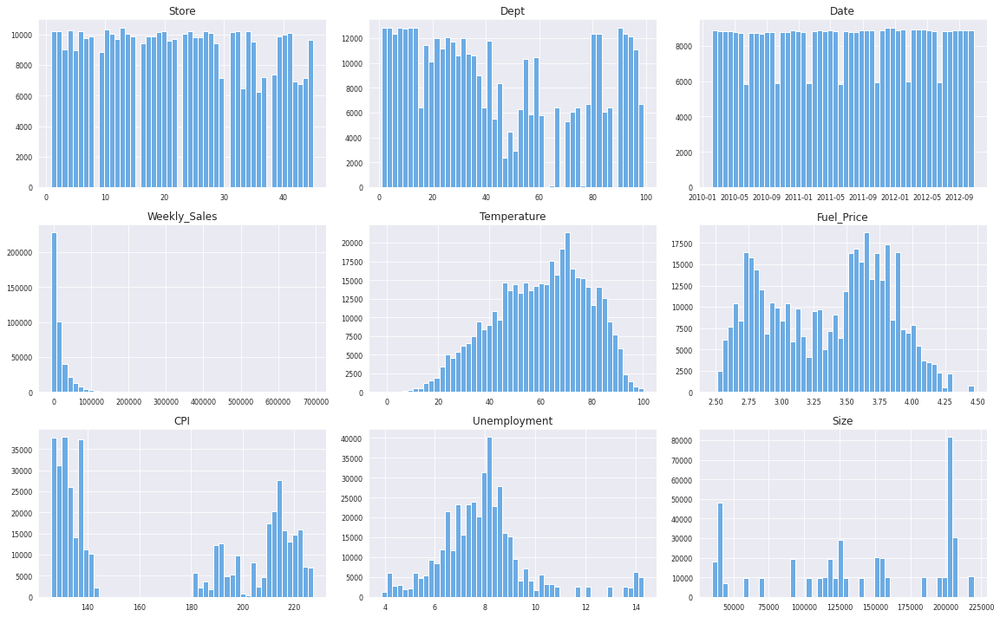

In [61]:
dict_dfs['train'][dict_dfs['train'].columns[dict_dfs['train'].dtypes!='object']].iloc[:,:10].hist(figsize=(16, 10), bins=50, xlabelsize=8, ylabelsize=8,color='#6cace4')
plt.tight_layout()
plt.show()

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Some variables are very far for normal distributions.</li>
    </ul>
<span>
    <h5> Decision here to not use lienar regressors as it would be hard to normalize the variables and mayba not use some of them.</h5>

<span style='color:#0071dc; font-family: Verdana'> Seeing correlation with target. <span>

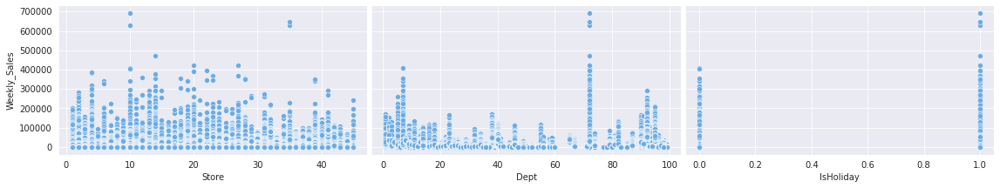

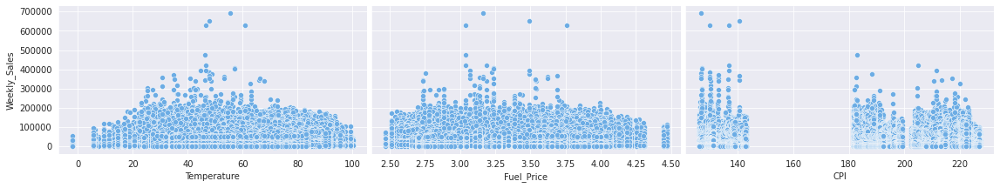

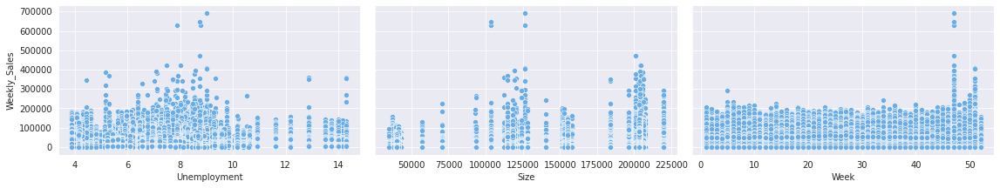

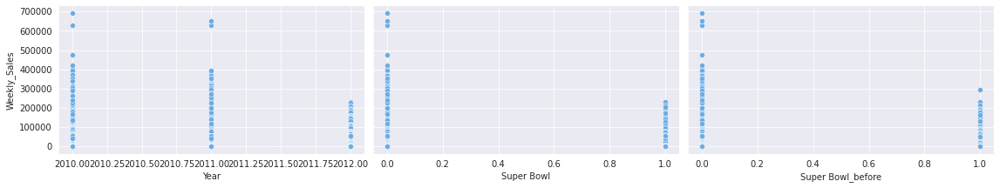

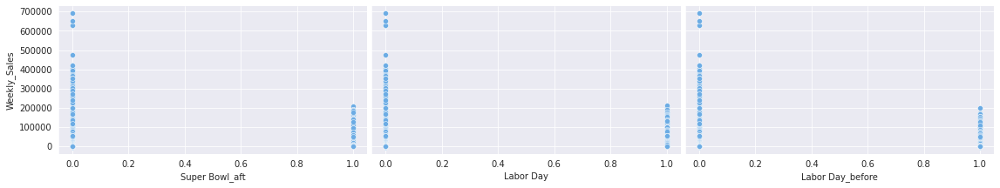

...

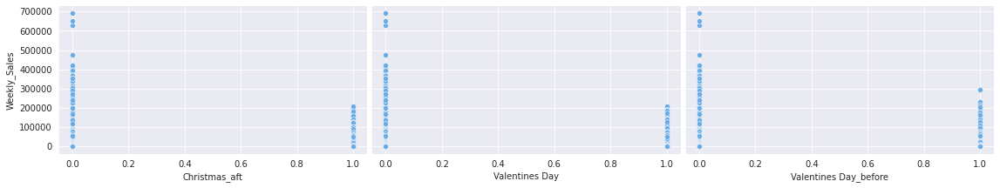

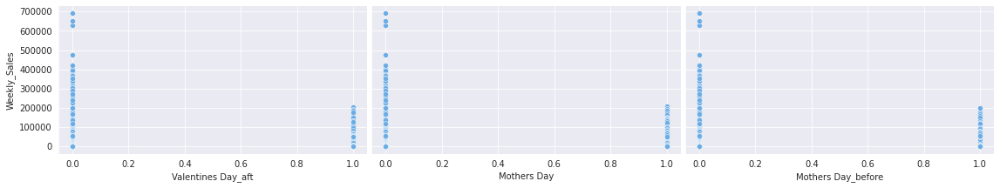

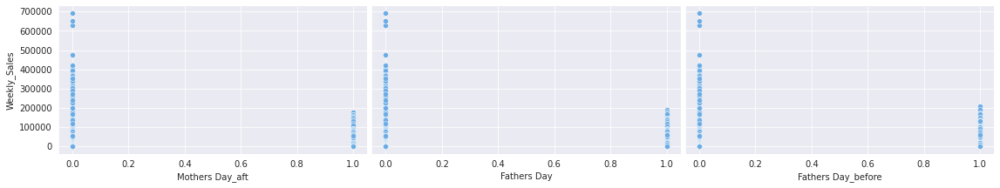

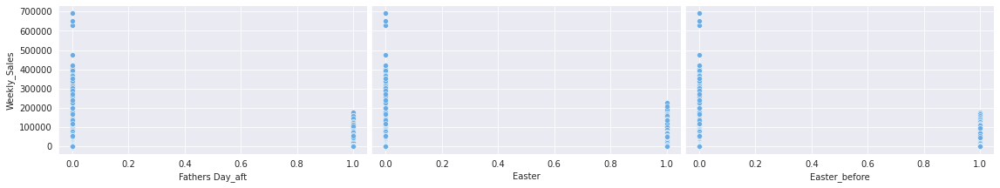

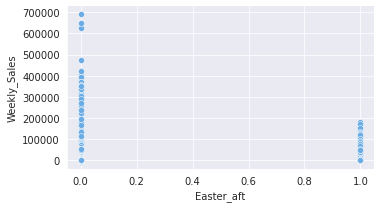

In [62]:
for i in range(0, len(dict_dfs['train'][dict_dfs['train'].columns[dict_dfs['train'].dtypes!='object']].drop(['Weekly_Sales','Date'],axis=1).columns), 3):
    sns.pairplot(data=dict_dfs['train'][dict_dfs['train'].columns[dict_dfs['train'].dtypes!='object']],
                x_vars=dict_dfs['train'][dict_dfs['train'].columns[dict_dfs['train'].dtypes!='object']].drop(['Weekly_Sales','Date'],axis=1).columns[i:i+3],
                y_vars=['Weekly_Sales'],
                 
                 plot_kws={'color': '#6cace4'},height=3,aspect=1.8)
plt.tight_layout()

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>It is possible to notice that some variables like temperature and IsHolliday have the biggest sales accumulated at some ranges, but not much of linear relationships.</li>
        <li>Also the flags created for the holidays shows a little bit of difference in the distribution, most clear to see are after christmas and at Thanksgiving
    </ul>
<span>
    <h5> Decision here to maintain Holiday flags.</h5>

In [63]:
dict_dfs['train'].IsHoliday=dict_dfs['train'].IsHoliday.astype(int)
dict_dfs['test'].IsHoliday=dict_dfs['test'].IsHoliday.astype(int)

<span style='color:#0071dc; font-family: Verdana'> Seeing Pearson's linear correlation with target. <span>

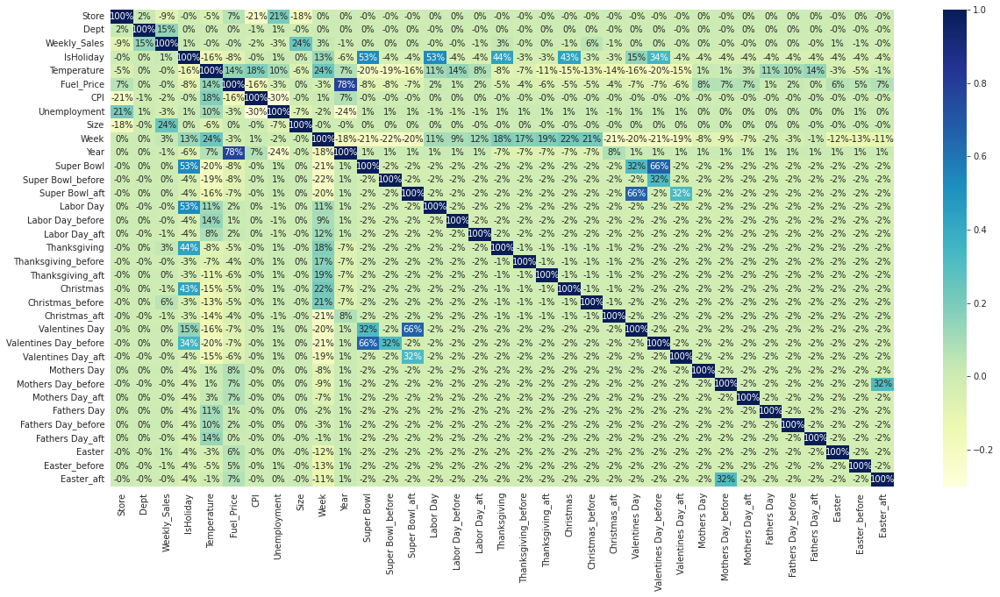

In [64]:
fig,ax=plt.subplots(figsize=(20,10))
sns.heatmap(dict_dfs['train'].corr(),cmap='YlGnBu',annot=True, fmt=".0%")
plt.show()

<span style='color:gray; font-family: Verdana'>
    <ul>
        <li>Size is the variable that has a little bit more of linear correlation with the Sales target and it makes sense because, usually the bigger the store is, more sales they have.</li>
        <li>CPI and Unemployment has not very much correlation with Weekly_Sales
    </ul>
<span>
    <h5> As seen in the missings plot and on the analysis above it will be decided to drop CPI and Unemployment.</h5>
<span style='color:gray; font-family: Verdana'>  <span>

In [65]:
dict_dfs['train']=dict_dfs['train'].drop(['CPI', 'Unemployment'],axis=1)
dict_dfs['test']=dict_dfs['test'].drop(['CPI', 'Unemployment'],axis=1)

<span style='color:#0071dc; font-family: Verdana'> Plotting categorical Store Type variable. <span>

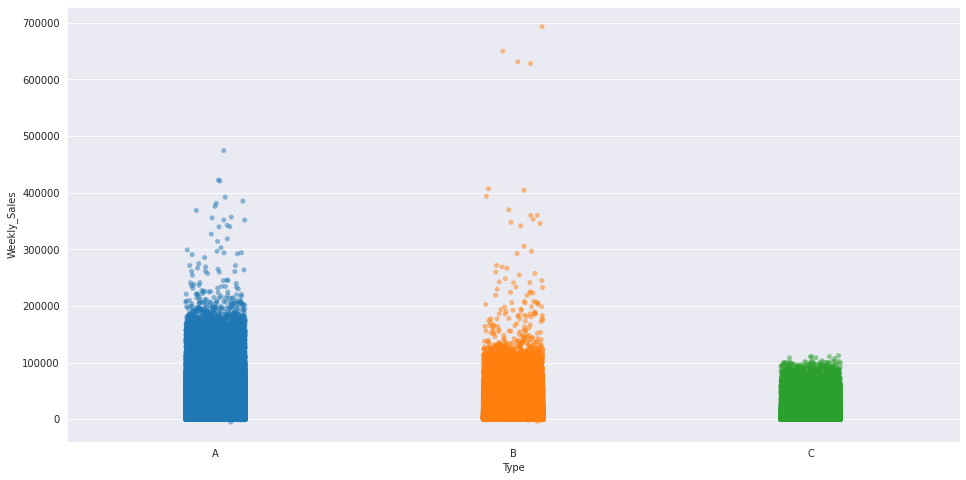

In [66]:
fig,ax=plt.subplots(figsize = (16, 8))
sns.stripplot(x='Type', y='Weekly_Sales', data=dict_dfs['train'],ax=ax,size=5,jitter=True,alpha=0.5)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.show()

<span style='color:gray; font-family: Verdana'> B has the highest weekly sales, A comes next and C has the least high weekly sales. <span>

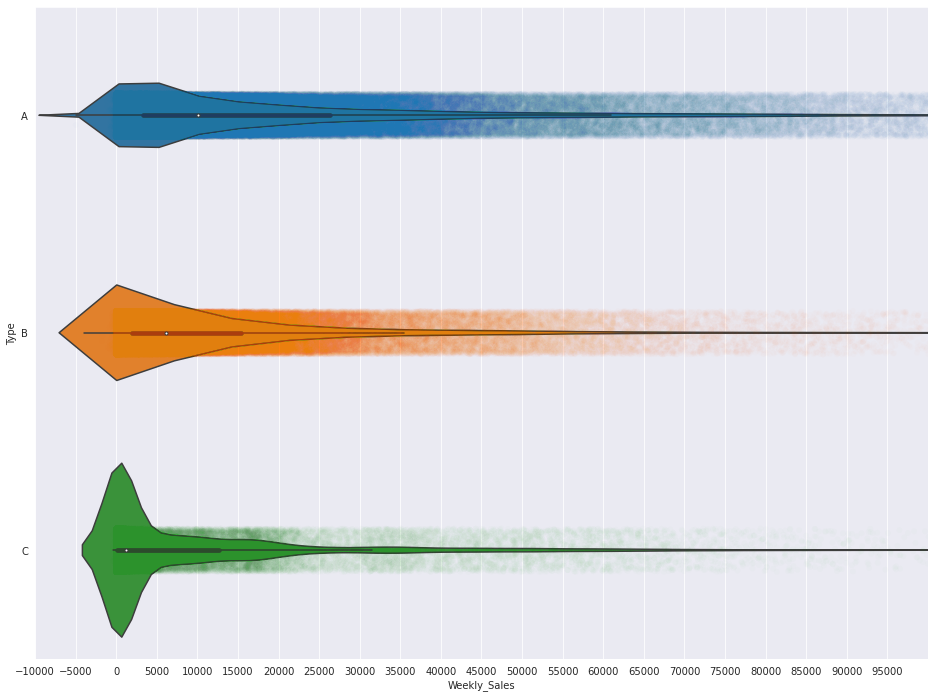

In [67]:
fig,ax=plt.subplots(figsize = (16, 12))
sns.stripplot(y='Type', x='Weekly_Sales', data=dict_dfs['train'],ax=ax,size=6,jitter=True,alpha=0.01)
sns.violinplot(y='Type', x='Weekly_Sales', data=dict_dfs['train'],ax=ax)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
ax.set_xticks([i for i in range(-10000,100000,5000)])
ax.set_xlim([-10000,100000])
plt.show()

<span style='color:gray; font-family: Verdana'> Looking at density, store types A and B are similar, but store A have a little bit more accumulated high weekly sales counts and store B have some outliers of high weekly sales. Store C have more low weekly sales accumulation. 
    <span>
            <h5 style='color:gray; font-family: Verdana'>Therefore store type may help us determine weekly sales.</h5>

In [68]:
dict_dfs['train']=dict_dfs['train'].join(pd.get_dummies(dict_dfs['train'].Type))
dict_dfs['train']=dict_dfs['train'].drop('Type',axis=1)
dict_dfs['test']=dict_dfs['test'].join(pd.get_dummies(dict_dfs['test'].Type))
dict_dfs['test']=dict_dfs['test'].drop('Type',axis=1)

<span style='color:#0071dc; font-family: Verdana'> Plotting Stores vs Departments. <span>

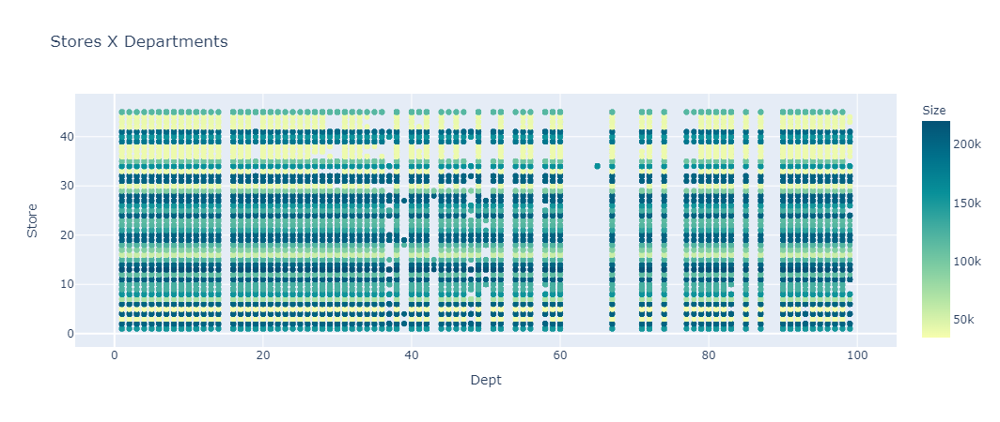

In [69]:
px.scatter(dict_dfs['train'],x='Dept',y='Store',title='Stores X Departments',color='Size',color_continuous_scale=px.colors.sequential.Bluyl)

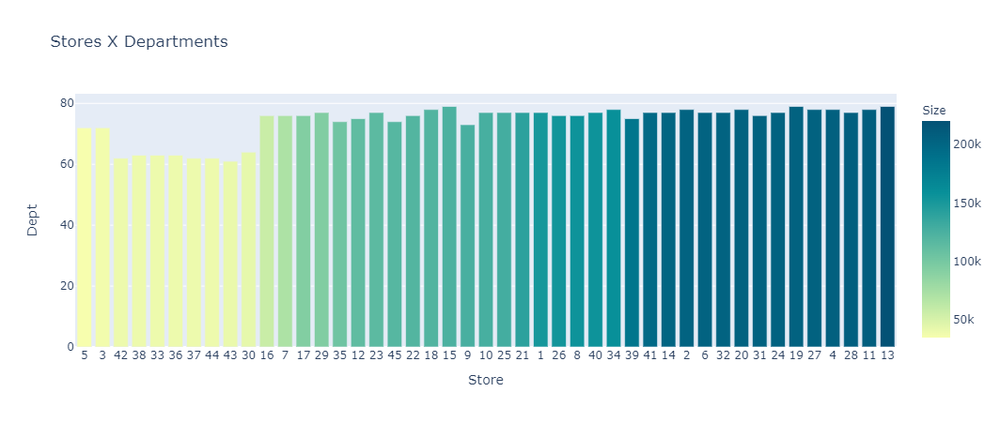

In [70]:
fig=px.bar(dict_dfs['train'].groupby('Store',as_index=False).agg({'Dept':'nunique','Size':'last'}),x='Store',y='Dept',title='Stores X Departments',color='Size',color_continuous_scale=px.colors.sequential.Bluyl)
fig.update_layout(
xaxis_type = 'category'
)
fig.update_xaxes(categoryorder='array', categoryarray=dict_dfs['train'].groupby('Store',as_index=False).agg({'Dept':'nunique','Size':'last'}).sort_values('Size').Store.to_list())
fig.show()

<span style='color:gray; font-family: Verdana'> As seen above the smallest stores seems to have the least number of departments and not all sotres have all departments. <span>

<span style='color:#0071dc; font-family: Verdana'> Plotting departments average week sales. <span>

In [71]:
df_plot_depts=dict_dfs['train'].groupby('Dept')['Weekly_Sales'].mean().reset_index()
df_plot_depts.Dept=df_plot_depts.Dept.astype(str)

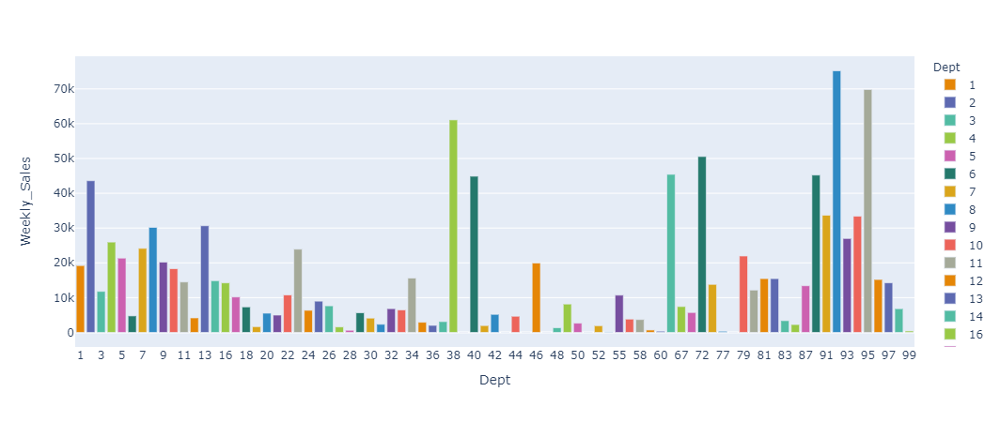

In [72]:
px.bar(df_plot_depts,x='Dept',y='Weekly_Sales',color='Dept',color_discrete_sequence=px.colors.qualitative.Vivid)

<span style='color:gray; font-family: Verdana'> Some departments average more sales than others. <span>

<span style='color:#0071dc; font-family: Verdana'> Plotting stores average of week sales. <span>

In [73]:
df_plot_stores=dict_dfs['train'].groupby('Store')['Weekly_Sales'].mean().reset_index()
df_plot_stores.Store=df_plot_stores.Store.astype(str)

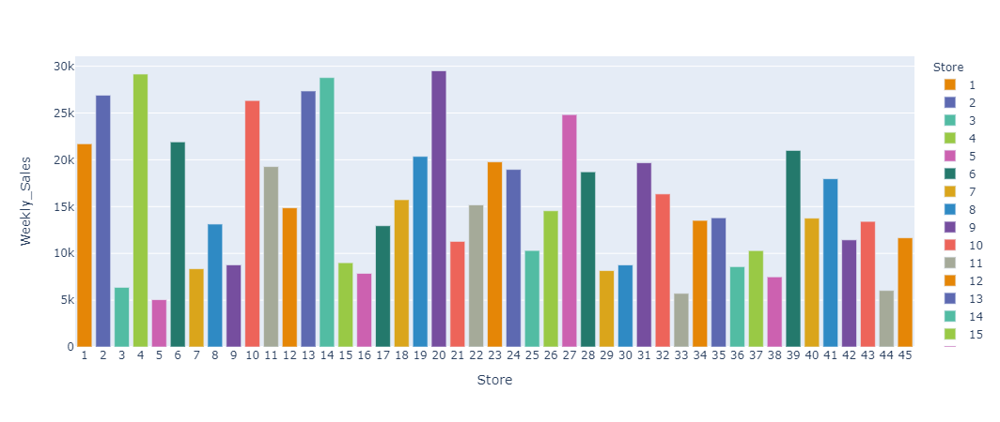

In [74]:
px.bar(df_plot_stores,x='Store',y='Weekly_Sales',color='Store',color_discrete_sequence=px.colors.qualitative.Vivid)

<span style='color:gray; font-family: Verdana'> There are clearly stores with more average sales than others. <span>
        <h5 style='color:gray; font-family: Verdana'>So Department and store number can be useful to predict weekly sales.</h5>

<h2 style='color:#ffc220; font-family: Verdana'> Handling the models </h2>

In [75]:
from sklearn.compose import make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import  OrdinalEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin


from sklearn.model_selection import train_test_split,RandomizedSearchCV,KFold
from sklearn.metrics import make_scorer,mean_absolute_error
from boruta import BorutaPy

from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

<h4 style='color:#0071dc; font-family: Verdana'> Reading again the datasets but this time for the models</h4>

In [76]:
with zipfile.ZipFile(join(filespath, 'train.csv.zip'),'r') as z:
    train=pd.read_csv(z.open('train.csv'))
with zipfile.ZipFile(join(filespath, 'test.csv.zip'),'r') as z:
    test=pd.read_csv(z.open('test.csv'))
with zipfile.ZipFile(join(filespath, 'features.csv.zip'),'r') as z:
    features=pd.read_csv(z.open('features.csv'))
stores=pd.read_csv(join(filespath, 'stores.csv'))

<h4 style='color:#0071dc; font-family: Verdana'> Merging datasets for the models</h4>

In [77]:
train=train.merge(features,how='left',on=['Store','Date','IsHoliday'])
train=train.merge(stores,how='left',on=['Store'])

In [78]:
test=test.merge(features,how='left',on=['Store','Date','IsHoliday'])
test=test.merge(stores,how='left',on=['Store'])

<h4 style='color:#0071dc; font-family: Verdana'> Making pipelines for the predictions</h4>

<h5 style='color:#ffc220; font-family: Verdana'> Pipeline for numerics </h5>

In [79]:
numerics = train.columns[((train.dtypes == 'float64')|(train.dtypes == 'int64'))&(train.columns!='Weekly_Sales')&(train.columns!='Store')&(train.columns!='Dept')]
numerics=list(numerics.drop(['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Unemployment']))

In [80]:
numerics

['Temperature', 'Fuel_Price', 'Size']

In [81]:
pipe_numerics = make_pipeline(
    SimpleImputer(strategy='mean'),
#     StandardScaler()
)

<span style='color:gray; font-family: Verdana'> Inputing the median as filling the empty values, because we don't want to be affected by outliers using like the average, using the standard scaler is not necessary for tree models but it is necessary to use with a linear regression baseline model if we want to test it </span>

<h5 style='color:#ffc220; font-family: Verdana'> Pipeline for categoricals </h5>

<span style='color:gray; font-family: Verdana'>Store dept and type are actually categories and so it would be better to rank them if we want to use them as numerics so dicts will be created ranking them by weekly sales</span>

In [82]:
df_test=train.groupby('Store',as_index=False).Weekly_Sales.mean().sort_values('Weekly_Sales',ascending=False).drop('Weekly_Sales',axis=1)
df_test=df_test.reset_index(drop=True).reset_index()

In [83]:
{int(i.split(':')[0]):int(i.split(':')[1]) for i in list(df_test.Store.astype(str)+':'+df_test.index.astype(str))}

{20: 0,
 4: 1,
 14: 2,
 13: 3,
 2: 4,
 10: 5,
 27: 6,
 6: 7,
 1: 8,
 39: 9,
 19: 10,
 23: 11,
 31: 12,
 11: 13,
 24: 14,
 28: 15,
 41: 16,
 32: 17,
 18: 18,
 22: 19,
 12: 20,
 26: 21,
 35: 22,
 40: 23,
 34: 24,
 43: 25,
 8: 26,
 17: 27,
 45: 28,
 42: 29,
 21: 30,
 25: 31,
 37: 32,
 15: 33,
 9: 34,
 30: 35,
 36: 36,
 7: 37,
 29: 38,
 16: 39,
 38: 40,
 3: 41,
 44: 42,
 33: 43,
 5: 44}

In [84]:
df_test=train.groupby('Type',as_index=False).Weekly_Sales.mean().sort_values('Weekly_Sales',ascending=False).drop('Weekly_Sales',axis=1)
df_test=df_test.reset_index(drop=True).reset_index()

In [85]:
{i.split(':')[0]:int(i.split(':')[1]) for i in list(df_test.Type.astype(str)+':'+df_test.index.astype(str))}

{'A': 0, 'B': 1, 'C': 2}

In [86]:
df_test=train.groupby('Dept',as_index=False).Weekly_Sales.mean().sort_values('Weekly_Sales',ascending=False).drop('Weekly_Sales',axis=1)
df_test=df_test.reset_index(drop=True).reset_index()

In [87]:
{int(i.split(':')[0]):int(i.split(':')[1]) for i in list(df_test.Dept.astype(str)+':'+df_test.index.astype(str))}

{92: 0,
 95: 1,
 38: 2,
 72: 3,
 65: 4,
 90: 5,
 40: 6,
 2: 7,
 91: 8,
 94: 9,
 13: 10,
 8: 11,
 93: 12,
 4: 13,
 7: 14,
 23: 15,
 79: 16,
 5: 17,
 9: 18,
 46: 19,
 1: 20,
 10: 21,
 34: 22,
 81: 23,
 82: 24,
 96: 25,
 14: 26,
 11: 27,
 97: 28,
 16: 29,
 74: 30,
 87: 31,
 80: 32,
 3: 33,
 22: 34,
 55: 35,
 17: 36,
 25: 37,
 49: 38,
 26: 39,
 67: 40,
 18: 41,
 32: 42,
 98: 43,
 33: 44,
 24: 45,
 71: 46,
 29: 47,
 20: 48,
 42: 49,
 21: 50,
 6: 51,
 44: 52,
 12: 53,
 30: 54,
 56: 55,
 58: 56,
 83: 57,
 37: 58,
 35: 59,
 50: 60,
 31: 61,
 85: 62,
 36: 63,
 41: 64,
 52: 65,
 19: 66,
 27: 67,
 48: 68,
 59: 69,
 28: 70,
 99: 71,
 60: 72,
 77: 73,
 54: 74,
 45: 75,
 51: 76,
 39: 77,
 78: 78,
 43: 79,
 47: 80}

In [88]:
class Store_dept_type(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        dict_dept={92: 0, 95: 1, 38: 2, 72: 3, 65: 4, 90: 5, 40: 6, 2: 7, 91: 8, 94: 9, 13: 10, 8: 11, 93: 12, 4: 13, 7: 14, 23: 15, 79: 16, 5: 17, 9: 18, 46: 19, 1: 20, 10: 21, 34: 22, 81: 23, 82: 24, 96: 25, 14: 26, 11: 27, 97: 28, 16: 29, 74: 30, 87: 31, 80: 32, 3: 33, 22: 34, 55: 35, 17: 36, 25: 37, 49: 38, 26: 39, 67: 40, 18: 41, 32: 42, 98: 43, 33: 44, 24: 45, 71: 46, 29: 47, 20: 48, 42: 49, 21: 50, 6: 51, 44: 52, 12: 53, 30: 54, 56: 55, 58: 56, 83: 57, 37: 58, 35: 59, 50: 60, 31: 61, 85: 62, 36: 63, 41: 64, 52: 65, 19: 66, 27: 67, 48: 68, 59: 69, 28: 70, 99: 71, 60: 72, 77: 73, 54: 74, 45: 75, 51: 76, 39: 77, 78: 78, 43: 79, 47: 80}
        dict_type={'A': 0, 'B': 1, 'C': 2}
        dict_stores={20: 0,  4: 1,  14: 2,  13: 3,  2: 4,  10: 5,  27: 6,  6: 7,  1: 8,  39: 9,  19: 10,  23: 11,  31: 12,  11: 13,  24: 14,  28: 15,  41: 16,  32: 17,  18: 18,  22: 19,  12: 20,  26: 21,  35: 22,  40: 23,  34: 24,  43: 25,  8: 26,  17: 27,  45: 28,  42: 29,  21: 30,  25: 31,  37: 32,  15: 33,  9: 34,  30: 35,  36: 36,  7: 37,  29: 38,  16: 39,  38: 40,  3: 41,  44: 42,  33: 43,  5: 44}
        dfz=X.copy(deep=True)
        dfz.Store=dfz.Store.replace(dict_stores)
        dfz.Dept=dfz.Dept.replace(dict_dept)
        dfz.Type=dfz.Type.replace(dict_type)
        return dfz

In [89]:
categoricals = train.columns[train.columns.isin(['Store','Dept','Type'])]

In [90]:
pipe_cats = make_pipeline(
    Store_dept_type()
)

<h5 style='color:#ffc220; font-family: Verdana'> Pipeline for Date </h5>

In [91]:
class Date_Transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        dict_holidays={
        'Super Bowl':  ['12-Feb-10', '11-Feb-11', '10-Feb-12', '08-Feb-13'],
        'Labor Day':    ['10-Sep-10', '09-Sep-11', '07-Sep-12', '06-Sep-13'],
        'Thanksgiving': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13'],
        'Christmas':    ['31-Dec-10', '30-Dec-11', '28-Dec-12', '27-Dec-13'],
        'Valentines Day': ['14-Feb-10', '14-Feb-11', '14-Feb-12', '14-Feb-13'],
        'Mothers Day': ['09-May-10', '08-May-11', '13-May-12', '12-May-13'],
        'Fathers Day': ['20-Jun-10', '19-Jun-11', '17-Jun-12', '16-Jun-13'],
        'Easter': ['04-Apr-10', '24-Apr-11', '08-Apr-12', '31-Mar-13'],
        'Black Friday': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13']
        }
        dict_holidays={i:[datetime.datetime.strptime(x,'%d-%b-%y') for x in dict_holidays[i]] for i in dict_holidays.keys()}
        dfz=X.copy(deep=True)
        dfz["Week"] = pd.to_datetime(dfz.Date).dt.isocalendar().week
        dfz["Year"] = pd.to_datetime(dfz.Date).dt.isocalendar().year
        dfz["Month"] = pd.to_datetime(dfz.Date).dt.month
        dfz["Day"] = pd.to_datetime(dfz.Date).dt.day
        for holiday in dict_holidays.keys():
            dfz[holiday]=0
            holbefcol=holiday+'_before'
            dfz[holbefcol]=0
            holaftcol=holiday+'_aft'
            dfz[holaftcol]=0
            dfholidaytemp=pd.Series(dict_holidays[holiday]).dt.isocalendar().iloc[:,:2]
            dfholidaytempbef=(pd.Series(dict_holidays[holiday])-pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
            dfholidaytempaft=(pd.Series(dict_holidays[holiday])+pd.Timedelta(weeks=1)).dt.isocalendar().iloc[:,:2]
            for nmr in range(len(dfholidaytemp)):
                dfz.loc[(dict_dfs['train'].Week==dfholidaytemp.iloc[nmr,1])&(dfz.Year==dfholidaytemp.iloc[nmr,0]),holiday]=1

                dfz.loc[(dict_dfs['train'].Week==dfholidaytempbef.iloc[nmr,1])&(dfz.Year==dfholidaytempbef.iloc[nmr,0]),holbefcol]=1

                dfz.loc[(dict_dfs['train'].Week==dfholidaytempaft.iloc[nmr,1])&(dfz.Year==dfholidaytempaft.iloc[nmr,0]),holaftcol]=1
        return dfz.drop('Date',axis=1)

In [92]:
dict_holidays={
    'Super Bowl':  ['12-Feb-10', '11-Feb-11', '10-Feb-12', '08-Feb-13'],
'Labor Day':    ['10-Sep-10', '09-Sep-11', '07-Sep-12', '06-Sep-13'],
'Thanksgiving': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13'],
'Christmas':    ['31-Dec-10', '30-Dec-11', '28-Dec-12', '27-Dec-13'],
'Valentines Day': ['14-Feb-10', '14-Feb-11', '14-Feb-12', '14-Feb-13'],
'Mothers Day': ['09-May-10', '08-May-11', '13-May-12', '12-May-13'],
'Fathers Day': ['20-Jun-10', '19-Jun-11', '17-Jun-12', '16-Jun-13'],
'Easter': ['04-Apr-10', '24-Apr-11', '08-Apr-12', '31-Mar-13'],
'Black Friday': ['26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13']
}
dict_holidays={i:[datetime.datetime.strptime(x,'%d-%b-%y') for x in dict_holidays[i]] for i in dict_holidays.keys()}
list_columns_date=[]
list_columns_date.append('Week')
list_columns_date.append('Year')
list_columns_date.append('Month')
list_columns_date.append('Day')
X=train.copy(deep=True)
X["Week"] = pd.to_datetime(X.Date).dt.isocalendar().week
X["Year"] = pd.to_datetime(X.Date).dt.isocalendar().year
for holiday in dict_holidays.keys():
    holbefcol=holiday+'_before'
    holaftcol=holiday+'_aft'
    list_columns_date.append(holiday)
    list_columns_date.append(holbefcol)
    list_columns_date.append(holaftcol)

In [93]:
pipe_date = make_pipeline(
    Date_Transformer()
)

<h5 style='color:#ffc220; font-family: Verdana'> Pipe bools</h5>

In [94]:
bools = train.columns[(train.dtypes == bool)]

In [95]:
class bool_transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        dfz=X.copy(deep=True)
        dfz=dfz.astype(int)
        return dfz

In [96]:
pipe_bools = make_pipeline(
    bool_transformer()
)

<h5 style='color:#ffc220; font-family: Verdana'> Merge Pipelines</h5>

In [97]:
pipe_prep =make_column_transformer(
    (pipe_numerics, numerics),
    (pipe_cats, categoricals),
    (pipe_date, ['Date']),
    (pipe_bools, bools)
)

<h4 style='color:#0071dc; font-family: Verdana'> Creating the evaluating methods</h4>

<h5 style='color:#ffc220; font-family: Verdana'> Creating the weighted mean average as suggested by the exercise description</h5>

<span style='color:gray; font-family: Verdana'> Matric for the train X test evaluation<span>

In [98]:
def Custom_WMAE(weights, y_true,y_pred):
    return np.average(np.abs(y_true - y_pred), weights=weights, axis=0)

<span style='color:gray; font-family: Verdana'> Metric for the crossvalidation score when tuning the parameters</span>

In [99]:
def Custom_WMAE_train(y_true,y_pred):
    return np.average(np.abs(y_true - y_pred), weights=train.iloc[y_true.index].IsHoliday.astype(int)*4+1, axis=0)
Custom_WMAE_train_scorer=make_scorer(Custom_WMAE_train)

<h5 style='color:#ffc220; font-family: Verdana'> Train test split </h5>

<span style='color:gray; font-family: Verdana'> Divinding the dataset in train and test by 'out-of-time' method, it means the train have a range of dates and the test another range, since in crossvalidation we already uses the other commonly used method 'out-of-sample'. <span>

In [100]:
train.Date.astype(str).str[:7].value_counts().sort_index()

2010-02    11839
2010-03    11788
2010-04    14697
2010-05    11672
2010-06    11661
2010-07    14561
2010-08    11603
2010-09    11724
2010-10    14667
2010-11    11712
2010-12    14755
2011-01    11695
2011-02    11741
2011-03    11813
2011-04    14746
2011-05    11820
2011-06    11723
2011-07    14621
2011-08    11765
2011-09    14761
2011-10    11820
2011-11    11901
2011-12    15047
2012-01    11850
2012-02    11946
2012-03    14850
2012-04    11889
2012-05    11822
2012-06    14753
2012-07    11798
2012-08    14801
2012-09    11854
2012-10    11875
Name: Date, dtype: int64

<span style='color:gray; font-family: Verdana'> As 2012 doesn't have the last weeks of the year that are very important and 2010 doesn't have the start of the year, the decision will be to split 2010 and 2011 until october for training and the rest for testing<span>

In [101]:
pd.to_datetime(train[pd.to_datetime(train.Date).dt.isocalendar().year==2012].Date).dt.isocalendar().week.max()

43

In [102]:
train[(pd.to_datetime(train.Date).dt.isocalendar().year==2011)&(pd.to_datetime(train.Date).dt.isocalendar().week==43)].Date

90        2011-10-28
233       2011-10-28
376       2011-10-28
519       2011-10-28
662       2011-10-28
             ...    
420960    2011-10-28
421094    2011-10-28
421237    2011-10-28
421382    2011-10-28
421517    2011-10-28
Name: Date, Length: 2964, dtype: object

In [103]:
X_train=pipe_prep.fit_transform(train[train.Date<='2011-10-28'].drop('Weekly_Sales',axis=1).reset_index(drop=True))

In [104]:
X_test=pipe_prep.transform(train[train.Date>'2011-10-28'].drop('Weekly_Sales',axis=1).reset_index(drop=True))

In [105]:
y_train=train[train.Date<='2011-10-28']['Weekly_Sales'].reset_index(drop=True)
y_test=train[train.Date>'2011-10-28']['Weekly_Sales'].reset_index(drop=True)

In [106]:
X_train_raw=train[train.Date<='2011-10-28'].drop('Weekly_Sales',axis=1).reset_index(drop=True)
X_test_raw=train[train.Date>'2011-10-28'].drop('Weekly_Sales',axis=1).reset_index(drop=True)

In [107]:
X_train_weights=train[train.Date<='2011-10-28'].IsHoliday.astype(int)*4+1
X_train_weights=X_train_weights.reset_index(drop=True)
X_test_weights=train[train.Date>'2011-10-28'].IsHoliday.astype(int)*4+1
X_test_weights=X_test_weights.reset_index(drop=True)

<h5 style='color:#ffc220; font-family: Verdana'> Function to test models </h5>

In [108]:
dict_models={'lgbm':LGBMRegressor(n_jobs=-1,random_state=42),
             'rf':RandomForestRegressor(n_jobs=-1,random_state=42),
             'xgb':XGBRegressor(n_jobs=-1,random_state=42),
             'en':ElasticNet(random_state=42),
             'lr':LinearRegression(n_jobs=-1)}

<span style='color:gray; font-family: Verdana'> Function to test models without tuning the hyperparameters<span>

In [109]:
def models_baseline_evaluation(model,X_train,y_train,X_test,y_test,X_train_weights,X_test_weights):
    start_time = time.time()
    model.fit(X_train,y_train)
    y_pred_train=model.predict(X_train)
    y_pred_test=model.predict(X_test)
    wmae_train=Custom_WMAE(X_train_weights,y_train,y_pred_train)
    wmae_test=Custom_WMAE(X_test_weights,y_test,y_pred_test)
    return print('Model:',str(model).split('(')[0],'Train Score:',wmae_train,'Test Score:',wmae_test,'Time:', (time.time() - start_time),'seconds')

<span style='color:gray; font-family: Verdana'> Function to test models with tuning the hyperparameters<span>

In [116]:
def models_with_tuning_evaluation(model,param,X_train,y_train,X_test,y_test,X_train_weights,X_test_weights):

    kfold = KFold(n_splits=3)
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions= random_grid,
        cv = kfold,
        verbose = 10,
        n_iter=30,
        n_jobs=1,
        return_train_score=True,
        scoring=Custom_WMAE_train_scorer)
    
    random_search.fit(X_train, y_train)
    df_results_cv=pd.DataFrame(random_search.cv_results_).sort_values('mean_test_score')
    df_results_cv['Overfit']=df_results_cv.mean_train_score/df_results_cv.mean_test_score
    
    return df_results_cv

<span style='color:gray; font-family: Verdana'> Function plot the models X the true values<span>

In [111]:
def model_evaluator(model,name):
    model_train_predict=model.predict(X_train_raw)
    model_test_predict=model.predict(X_test_raw)
    print('Train WMAE:',Custom_WMAE(X_train_weights, y_train, model_train_predict))
    print('Test WMAE:',Custom_WMAE(X_test_weights, y_test, model_test_predict))
    model_predicted_week_sales=pd.DataFrame(list(model_train_predict)+list(model_test_predict),columns=[f'Weekly_Sales_{name}'])
    df_plot=pd.concat([train[['Date','Weekly_Sales']],model_predicted_week_sales],axis=1)
    df_plot=df_plot.groupby('Date',as_index=False).mean()
    return pd.concat([X_train_raw.join(pd.Series(model_train_predict,name='pred')).join(pd.Series(y_train,name='true')).sort_values('Date').groupby('Date').mean()[['true']],X_test_raw.join(pd.Series(model_test_predict,name='pred')).join(pd.Series(y_test,name='true')).sort_values('Date').groupby('Date').mean()[['pred']]],axis=0).plot.line(figsize=(16,8))

In [136]:
def plot_feature_importance(model):
    features=[x for i in model.named_steps['prep'].get_params()['transformers'] for x  in list(i[2]) ]
    features.remove('Date')
    features=features+list_columns_date+['IsHoliday']
    features.remove('IsHoliday')
    fig1=px.bar(pd.DataFrame(model['model'].feature_importances_,index=features,columns=['FI']).sort_values('FI',ascending=False),orientation='h',title='Importances by split',height=600)
    fig1.show()
    if 'lgbm' in str(model['model']).lower():
        fig2=px.bar(pd.DataFrame(model['model'].booster_.feature_importance(importance_type='gain'),index=features,columns=['FI']).sort_values('FI',ascending=False),orientation='h',title='Importances by gain',height=600)
        fig2.show()

<h4 style='color:#0071dc; font-family: Verdana'> Evaluating models</h4>

<h5 style='color:#ffc220; font-family: Verdana'> Evaluating baselines</h5>

In [113]:
for model in dict_models.keys():
    models_baseline_evaluation(dict_models[model],X_train,y_train,X_test,y_test,X_train_weights,X_test_weights)

Model: LGBMRegressor Train Score: 3772.9740566147543 Test Score: 4112.2721585026175 Time: 4.338783025741577 seconds
Model: RandomForestRegressor Train Score: 575.8344039560293 Test Score: 2057.081420335557 Time: 75.46682739257812 seconds
Model: XGBRegressor Train Score: 2789.0277839871305 Test Score: 3280.3494019936684 Time: 28.108290195465088 seconds
Model: ElasticNet Train Score: 10239.200380379869 Test Score: 10399.886798782007 Time: 5.563540935516357 seconds
Model: LinearRegression Train Score: 10253.632735393001 Test Score: 10274.616564506967 Time: 2.7616169452667236 seconds


<span style='color:gray; font-family: Verdana'> As said before, the linear models did not predict very well our target, probably because we do not have many strong linear relationships. Also, XGBRegressor wont be tested mainly because of time consuming and lgbm is similar but faster.
Decision here to focus on the LGBMRegressor and or Randim Forest as an MVP.<span>

<h5 style='color:#ffc220; font-family: Verdana'> Evaluating models with tuning search </h5>

<span style='color:#0071dc; font-family: Verdana'> Random Search for hyperparameters tuning for the Lgbm<span>

In [205]:
max_bin  = [int(x) for x in range(20, 500,50)]
num_leaves = [int(x) for x in range(20, 500,50)]
num_iterations = [i for i in range(20, 500,50)]
learning_rate = [i for i in np.arange(0.02, 0.3, 0.03)]

random_grid = {
'max_bin': max_bin,
'num_leaves': num_leaves,
'learning_rate' :learning_rate,
'num_iterations' :num_iterations
}

In [206]:
df_results_cv_lgb=models_with_tuning_evaluation(dict_models['lgbm'],random_grid,X_train,y_train,X_test,y_test,X_train_weights,X_test_weights)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV 1/3; 1/30] START learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 1/30] END learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220;, score=(train=1256.301, test=5392.537) total time=   3.3s
[CV 2/3; 1/30] START learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 1/30] END learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220;, score=(train=1267.202, test=4997.114) total time=   3.3s
[CV 3/3; 1/30] START learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 1/30] END learning_rate=0.23, max_bin=470, num_iterations=120, num_leaves=220;, score=(train=1448.443, test=6465.504) total time=   3.4s
[CV 1/3; 2/30] START learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 2/30] END learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370;, score=(train=957.041, test=5558.682) total time=   3.8s
[CV 2/3; 2/30] START learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 2/30] END learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370;, score=(train=1003.756, test=5133.255) total time=   3.7s
[CV 3/3; 2/30] START learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 2/30] END learning_rate=0.29000000000000004, max_bin=170, num_iterations=120, num_leaves=370;, score=(train=1150.176, test=6581.888) total time=   3.6s
[CV 1/3; 3/30] START learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 3/30] END learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20;, score=(train=1833.193, test=5383.835) total time=   4.0s
[CV 2/3; 3/30] START learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 3/30] END learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20;, score=(train=1942.760, test=4490.931) total time=   3.8s
[CV 3/3; 3/30] START learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 3/30] END learning_rate=0.23, max_bin=70, num_iterations=470, num_leaves=20;, score=(train=2099.565, test=6408.067) total time=   3.9s
[CV 1/3; 4/30] START learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 4/30] END learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420;, score=(train=5782.275, test=7772.027) total time=   1.8s
[CV 2/3; 4/30] START learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 4/30] END learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420;, score=(train=6305.355, test=7494.936) total time=   1.9s
[CV 3/3; 4/30] START learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 4/30] END learning_rate=0.05, max_bin=120, num_iterations=20, num_leaves=420;, score=(train=6734.902, test=8691.332) total time=   1.8s
[CV 1/3; 5/30] START learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 5/30] END learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70;, score=(train=2982.513, test=5483.595) total time=   2.6s
[CV 2/3; 5/30] START learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 5/30] END learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70;, score=(train=3231.356, test=4994.098) total time=   2.5s
[CV 3/3; 5/30] START learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 5/30] END learning_rate=0.05, max_bin=120, num_iterations=120, num_leaves=70;, score=(train=3346.210, test=6152.086) total time=   2.6s
[CV 1/3; 6/30] START learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 6/30] END learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320;, score=(train=3833.757, test=6782.058) total time=   4.0s
[CV 2/3; 6/30] START learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 6/30] END learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320;, score=(train=3995.963, test=6052.766) total time=   4.1s
[CV 3/3; 6/30] START learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 6/30] END learning_rate=0.2, max_bin=20, num_iterations=170, num_leaves=320;, score=(train=4298.827, test=6365.541) total time=   4.0s
[CV 1/3; 7/30] START learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 7/30] END learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170;, score=(train=2114.880, test=5318.903) total time=   7.3s
[CV 2/3; 7/30] START learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 7/30] END learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170;, score=(train=2287.440, test=4942.638) total time=   7.7s
[CV 3/3; 7/30] START learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 7/30] END learning_rate=0.02, max_bin=320, num_iterations=370, num_leaves=170;, score=(train=2444.903, test=6329.853) total time=   7.9s
[CV 1/3; 8/30] START learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 8/30] END learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370;, score=(train=3504.742, test=6896.432) total time=   5.9s
[CV 2/3; 8/30] START learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 8/30] END learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370;, score=(train=3634.594, test=6172.002) total time=   6.0s
[CV 3/3; 8/30] START learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 8/30] END learning_rate=0.23, max_bin=20, num_iterations=270, num_leaves=370;, score=(train=3938.856, test=6534.128) total time=   5.9s
[CV 1/3; 9/30] START learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 9/30] END learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170;, score=(train=1413.041, test=5253.233) total time=   5.6s
[CV 2/3; 9/30] START learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 9/30] END learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170;, score=(train=1470.927, test=4846.885) total time=   5.3s
[CV 3/3; 9/30] START learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 9/30] END learning_rate=0.08, max_bin=70, num_iterations=320, num_leaves=170;, score=(train=1644.786, test=6430.226) total time=   5.5s
[CV 1/3; 10/30] START learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 10/30] END learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20;, score=(train=2217.281, test=5389.123) total time=   3.8s
[CV 2/3; 10/30] START learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 10/30] END learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20;, score=(train=2400.853, test=4366.625) total time=   4.3s
[CV 3/3; 10/30] START learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 10/30] END learning_rate=0.14, max_bin=320, num_iterations=420, num_leaves=20;, score=(train=2635.382, test=6255.445) total time=   3.8s
[CV 1/3; 11/30] START learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 11/30] END learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120;, score=(train=1633.283, test=5263.389) total time=   3.2s
[CV 2/3; 11/30] START learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 11/30] END learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120;, score=(train=1658.246, test=4639.212) total time=   3.2s
[CV 3/3; 11/30] START learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 11/30] END learning_rate=0.14, max_bin=170, num_iterations=170, num_leaves=120;, score=(train=1892.623, test=6315.118) total time=   3.3s
[CV 1/3; 12/30] START learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 12/30] END learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120;, score=(train=2397.220, test=5340.069) total time=   6.5s
[CV 2/3; 12/30] START learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 12/30] END learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120;, score=(train=2590.491, test=4886.866) total time=   6.6s
[CV 3/3; 12/30] START learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 12/30] END learning_rate=0.02, max_bin=420, num_iterations=370, num_leaves=120;, score=(train=2708.481, test=6229.721) total time=   6.6s
[CV 1/3; 13/30] START learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 13/30] END learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320;, score=(train=1002.370, test=5406.252) total time=   9.1s
[CV 2/3; 13/30] START learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 13/30] END learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320;, score=(train=1065.556, test=5027.276) total time=   8.9s
[CV 3/3; 13/30] START learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 13/30] END learning_rate=0.08, max_bin=70, num_iterations=420, num_leaves=320;, score=(train=1209.664, test=6535.790) total time=   9.0s
[CV 1/3; 14/30] START learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 14/30] END learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70;, score=(train=1078.774, test=5418.266) total time=   5.2s
[CV 2/3; 14/30] START learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 14/30] END learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70;, score=(train=1138.861, test=4652.194) total time=   4.8s
[CV 3/3; 14/30] START learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 14/30] END learning_rate=0.26, max_bin=170, num_iterations=470, num_leaves=70;, score=(train=1305.608, test=6407.091) total time=   4.9s
[CV 1/3; 15/30] START learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 15/30] END learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320;, score=(train=955.521, test=5369.972) total time=   9.9s
[CV 2/3; 15/30] START learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 15/30] END learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320;, score=(train=986.321, test=5004.908) total time=  10.5s
[CV 3/3; 15/30] START learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 15/30] END learning_rate=0.08, max_bin=420, num_iterations=420, num_leaves=320;, score=(train=1148.805, test=6498.197) total time=  10.5s
[CV 1/3; 16/30] START learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 16/30] END learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420;, score=(train=3273.235, test=6976.434) total time=   8.4s
[CV 2/3; 16/30] START learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 16/30] END learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420;, score=(train=3407.357, test=6251.492) total time=   8.5s
[CV 3/3; 16/30] START learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 16/30] END learning_rate=0.23, max_bin=20, num_iterations=370, num_leaves=420;, score=(train=3687.322, test=6694.226) total time=   8.6s
[CV 1/3; 17/30] START learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 17/30] END learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370;, score=(train=895.640, test=5404.583) total time=   7.9s
[CV 2/3; 17/30] START learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 17/30] END learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370;, score=(train=918.495, test=5009.788) total time=   8.2s
[CV 3/3; 17/30] START learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 17/30] END learning_rate=0.11000000000000001, max_bin=320, num_iterations=320, num_leaves=370;, score=(train=1070.783, test=6539.593) total time=   8.7s
[CV 1/3; 18/30] START learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 18/30] END learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370;, score=(train=1090.170, test=5432.368) total time=  11.9s
[CV 2/3; 18/30] START learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 18/30] END learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370;, score=(train=1136.093, test=5076.711) total time=  12.4s
[CV 3/3; 18/30] START learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 18/30] END learning_rate=0.05, max_bin=70, num_iterations=470, num_leaves=370;, score=(train=1279.351, test=6524.530) total time=  11.7s
[CV 1/3; 19/30] START learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 19/30] END learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420;, score=(train=783.524, test=5548.977) total time=   6.9s
[CV 2/3; 19/30] START learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 19/30] END learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420;, score=(train=803.884, test=5157.662) total time=   6.8s
[CV 3/3; 19/30] START learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 19/30] END learning_rate=0.17, max_bin=120, num_iterations=270, num_leaves=420;, score=(train=941.655, test=6552.574) total time=   6.9s
[CV 1/3; 20/30] START learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 20/30] END learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470;, score=(train=2779.782, test=5890.372) total time=   1.8s
[CV 2/3; 20/30] START learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 20/30] END learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470;, score=(train=2972.707, test=5718.365) total time=   1.9s
[CV 3/3; 20/30] START learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 20/30] END learning_rate=0.11000000000000001, max_bin=120, num_iterations=20, num_leaves=470;, score=(train=3283.530, test=6926.596) total time=   1.9s
[CV 1/3; 21/30] START learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 21/30] END learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220;, score=(train=2851.764, test=5687.071) total time=   1.8s
[CV 2/3; 21/30] START learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 21/30] END learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220;, score=(train=3077.061, test=5493.864) total time=   1.7s
[CV 3/3; 21/30] START learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 21/30] END learning_rate=0.14, max_bin=320, num_iterations=20, num_leaves=220;, score=(train=3310.112, test=6600.126) total time=   1.8s
[CV 1/3; 22/30] START learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 22/30] END learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220;, score=(train=1047.841, test=5345.023) total time=   6.7s
[CV 2/3; 22/30] START learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 22/30] END learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220;, score=(train=1069.406, test=4830.693) total time=   7.1s
[CV 3/3; 22/30] START learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 22/30] END learning_rate=0.11000000000000001, max_bin=370, num_iterations=370, num_leaves=220;, score=(train=1248.324, test=6441.555) total time=   7.1s
[CV 1/3; 23/30] START learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 23/30] END learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470;, score=(train=842.056, test=5540.973) total time=  13.2s
[CV 2/3; 23/30] START learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 23/30] END learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470;, score=(train=899.179, test=5195.109) total time=  13.2s
[CV 3/3; 23/30] START learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 23/30] END learning_rate=0.08, max_bin=70, num_iterations=470, num_leaves=470;, score=(train=1006.675, test=6554.145) total time=  13.3s
[CV 1/3; 24/30] START learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 24/30] END learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370;, score=(train=867.905, test=5440.975) total time=  11.3s
[CV 2/3; 24/30] START learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 24/30] END learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370;, score=(train=876.886, test=5049.643) total time=  11.7s
[CV 3/3; 24/30] START learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 24/30] END learning_rate=0.08, max_bin=170, num_iterations=470, num_leaves=370;, score=(train=1056.312, test=6514.075) total time=  11.6s
[CV 1/3; 25/30] START learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 25/30] END learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320;, score=(train=1287.295, test=5449.247) total time=   2.8s
[CV 2/3; 25/30] START learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 25/30] END learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320;, score=(train=1363.688, test=5017.145) total time=   2.9s
[CV 3/3; 25/30] START learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 25/30] END learning_rate=0.23, max_bin=420, num_iterations=70, num_leaves=320;, score=(train=1524.845, test=6542.245) total time=   2.8s
[CV 1/3; 26/30] START learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 26/30] END learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70;, score=(train=4302.082, test=6536.051) total time=   4.4s
[CV 2/3; 26/30] START learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 26/30] END learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70;, score=(train=4432.865, test=5726.923) total time=   4.4s
[CV 3/3; 26/30] START learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 26/30] END learning_rate=0.08, max_bin=20, num_iterations=370, num_leaves=70;, score=(train=4786.996, test=5992.600) total time=   4.5s
[CV 1/3; 27/30] START learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 27/30] END learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220;, score=(train=4584.746, test=6707.294) total time=   4.2s
[CV 2/3; 27/30] START learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 27/30] END learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220;, score=(train=4740.056, test=5848.787) total time=   4.2s
[CV 3/3; 27/30] START learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 27/30] END learning_rate=0.02, max_bin=20, num_iterations=170, num_leaves=220;, score=(train=5095.863, test=6256.488) total time=   4.0s
[CV 1/3; 28/30] START learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 28/30] END learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70;, score=(train=1481.297, test=5332.003) total time=   4.4s
[CV 2/3; 28/30] START learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 28/30] END learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70;, score=(train=1547.416, test=4615.503) total time=   4.4s
[CV 3/3; 28/30] START learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 28/30] END learning_rate=0.14, max_bin=370, num_iterations=370, num_leaves=70;, score=(train=1738.343, test=6358.599) total time=   5.1s
[CV 1/3; 29/30] START learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 29/30] END learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470;, score=(train=5721.616, test=7789.082) total time=   1.9s
[CV 2/3; 29/30] START learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 29/30] END learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470;, score=(train=6240.095, test=7506.445) total time=   2.1s
[CV 3/3; 29/30] START learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 29/30] END learning_rate=0.05, max_bin=320, num_iterations=20, num_leaves=470;, score=(train=6691.179, test=8679.470) total time=   1.9s
[CV 1/3; 30/30] START learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 1/3; 30/30] END learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470;, score=(train=675.070, test=5545.629) total time=   7.2s
[CV 2/3; 30/30] START learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 2/3; 30/30] END learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470;, score=(train=682.465, test=5188.534) total time=   7.1s
[CV 3/3; 30/30] START learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470


Found `num_iterations` in params. Will use it instead of argument


[CV 3/3; 30/30] END learning_rate=0.23, max_bin=120, num_iterations=270, num_leaves=470;, score=(train=803.747, test=6600.685) total time=   7.3s


Found `num_iterations` in params. Will use it instead of argument


<span style='color:#0071dc; font-family: Verdana'> Choosing the best parameters for performance X overfiting <span>

In [207]:
df_results_cv_lgb.sort_values("mean_train_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_num_leaves,param_num_iterations,param_max_bin,param_learning_rate,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score,Overfit
29,5.783899,0.088691,1.415916,0.036152,470,270,120,0.23,"{'num_leaves': 470, 'num_iterations': 270, 'ma...",5545.629305,5188.533702,6600.684905,5778.282637,599.521161,10,675.069541,682.464780,803.747090,720.427137,58.993408,0.124678
18,5.492930,0.012969,1.383619,0.038089,420,270,120,0.17,"{'num_leaves': 420, 'num_iterations': 270, 'ma...",5548.976796,5157.662160,6552.573557,5753.070838,587.472118,13,783.523532,803.883760,941.654964,843.020752,70.238478,0.146534
22,9.558536,0.174037,3.659177,0.138683,470,470,70,0.08,"{'num_leaves': 470, 'num_iterations': 470, 'ma...",5540.972647,5195.108806,6554.145477,5763.408976,576.688020,11,842.056341,899.179180,1006.674771,915.970097,68.245918,0.158929
23,8.501088,0.178959,3.053767,0.025087,370,470,170,0.08,"{'num_leaves': 370, 'num_iterations': 470, 'ma...",5440.974603,5049.643473,6514.075010,5668.231029,619.071371,16,867.905201,876.885681,1056.312339,933.701073,86.776740,0.164725
16,6.618377,0.320166,1.638366,0.009252,370,320,320,0.11,"{'num_leaves': 370, 'num_iterations': 320, 'ma...",5404.582618,5009.788314,6539.593415,5651.321449,648.452491,18,895.640042,918.495059,1070.783084,961.639395,77.738222,0.170162
14,7.869645,0.284918,2.434867,0.081023,320,420,420,0.08,"{'num_leaves': 320, 'num_iterations': 420, 'ma...",5369.972207,5004.908468,6498.197257,5624.359311,635.616473,19,955.520972,986.321446,1148.805241,1030.215886,84.792860,0.183170
1,2.993466,0.050403,0.707644,0.019756,370,120,170,0.29,"{'num_leaves': 370, 'num_iterations': 120, 'ma...",5558.681573,5133.255082,6581.888218,5757.941624,607.954448,12,957.041214,1003.756337,1150.176470,1036.991340,82.274868,0.180098
12,6.748593,0.066167,2.249452,0.049468,320,420,70,0.08,"{'num_leaves': 320, 'num_iterations': 420, 'ma...",5406.251669,5027.276359,6535.789628,5656.439219,640.753946,17,1002.369920,1065.556212,1209.664073,1092.530068,86.750247,0.193148
21,5.459616,0.186478,1.512804,0.032535,220,370,370,0.11,"{'num_leaves': 220, 'num_iterations': 370, 'ma...",5345.022909,4830.693488,6441.555242,5539.090546,671.796389,22,1047.840574,1069.406458,1248.324338,1121.857124,89.858181,0.202535
17,8.606040,0.250130,3.377544,0.087327,370,470,70,0.05,"{'num_leaves': 370, 'num_iterations': 470, 'ma...",5432.367748,5076.710587,6524.530201,5677.869512,616.035035,14,1090.170213,1136.093371,1279.350817,1168.538134,80.568075,0.205806


In [208]:
df_results_cv_lgb.sort_values("mean_train_score").iloc[0].params

{'num_leaves': 470,
 'num_iterations': 270,
 'max_bin': 120,
 'learning_rate': 0.23}

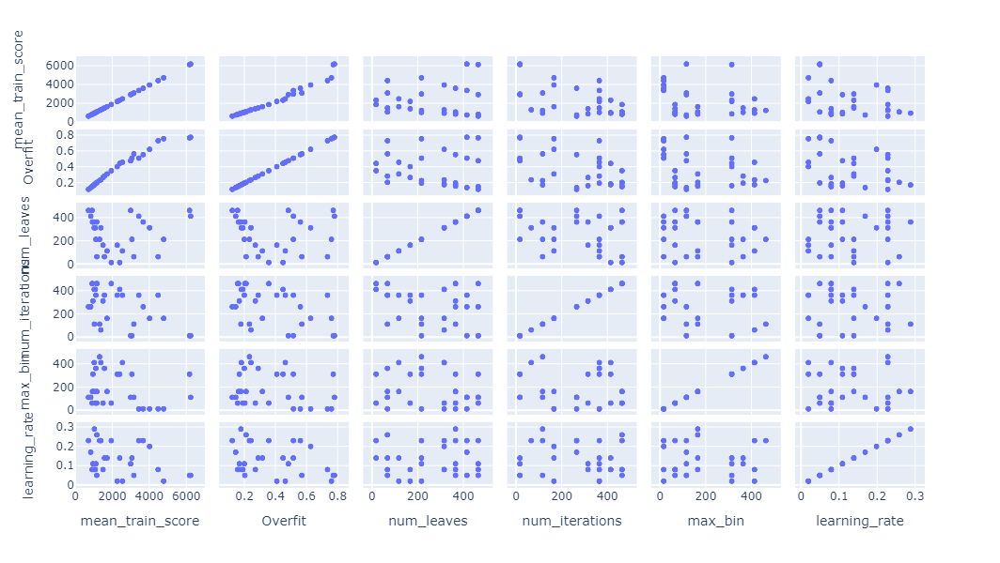

In [209]:
px.scatter_matrix(df_results_cv_lgb[['mean_train_score','Overfit']].join(df_results_cv_lgb.params.apply(pd.Series)),height=600,width=1100)

<span style='color:gray; font-family: Verdana'> Choosing params that are more correlated to small errors <span>

<span style='color:#0071dc; font-family: Verdana'> Fiting the best overfit x performance model <span>

In [ ]:
{'num_leaves': 470,
 'num_iterations': 270,
 'max_bin': 120,
 'learning_rate': 0.23}

In [210]:
lgb=LGBMRegressor(random_state=42,n_jobs=-1, num_leaves= 470, learning_rate = 0.23,num_iterations=270, max_bin=120) 

In [211]:
pkl_lgb=Pipeline(steps=[('prep',pipe_prep),('model',lgb)])

<span style='color:#0071dc; font-family: Verdana'> Adding weights <span>

In [212]:
coldt=pd.to_datetime(X_train_raw.Date)
weightmultiplier=pd.Series((coldt.dt.isocalendar().week==47)|(coldt.dt.isocalendar().week==51)).astype(int)*9+1

<span style='color:gray; font-family: Verdana'> Because Thanksgiving and Christmas are huge outliers in sales, the model usually have a hard time predicting them so, weights are beeing added to the fitting parameters.<span>

In [213]:
pkl_lgb.fit(X_train_raw,y_train,**{'model__sample_weight': X_train_weights*weightmultiplier})

Found `num_iterations` in params. Will use it instead of argument


Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer())]),
                                                  ['Temperature', 'Fuel_Price',
                                                   'Size']),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('store_dept_type',
                                                                   Store_dept_type())]),
                                                  Index(['Store', 'Dept', 'Type'], dtype='object')),
                                                 ('pipeline-3',
                                                  Pipeline(steps=[('date_transformer',
                                                                   Date_Transformer())]),
                  

<span style='color:#0071dc; font-family: Verdana'> Evaluating the model<span>

Train WMAE: 892.3933841743291
Test WMAE: 2309.010165574624


<AxesSubplot:xlabel='Date'>

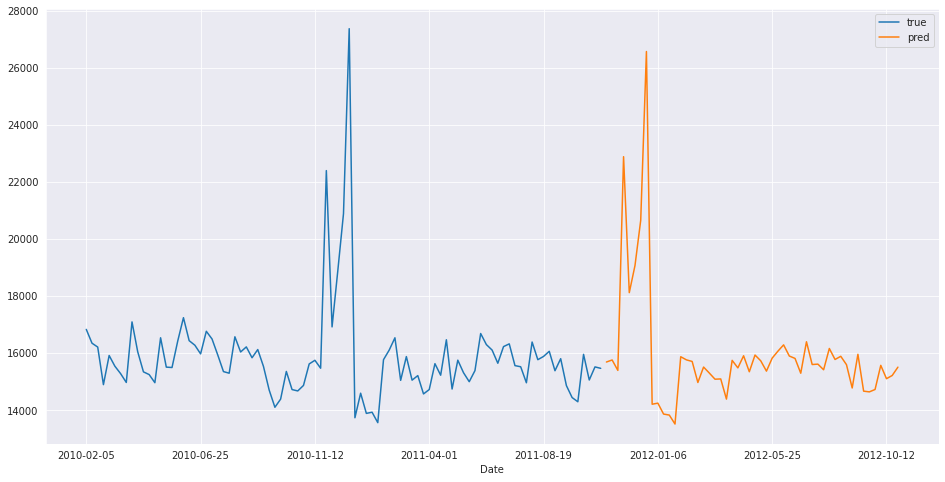

In [214]:
model_evaluator(pkl_lgb,'LightGBM')

<span style='color:gray; font-family: Verdana'> It is possible to see that the model was abel to fit very well specially when dealing with the outliers of christmas and thanksgiving, because of the weights added to them.<span>

<span style='color:#0071dc; font-family: Verdana'> Evaluating the importance of the features by the model.<span>

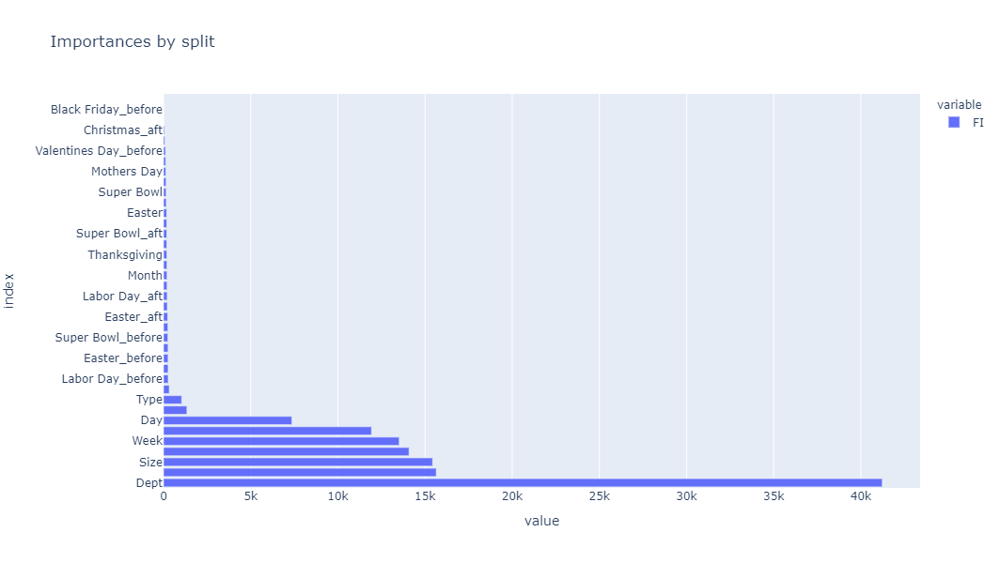

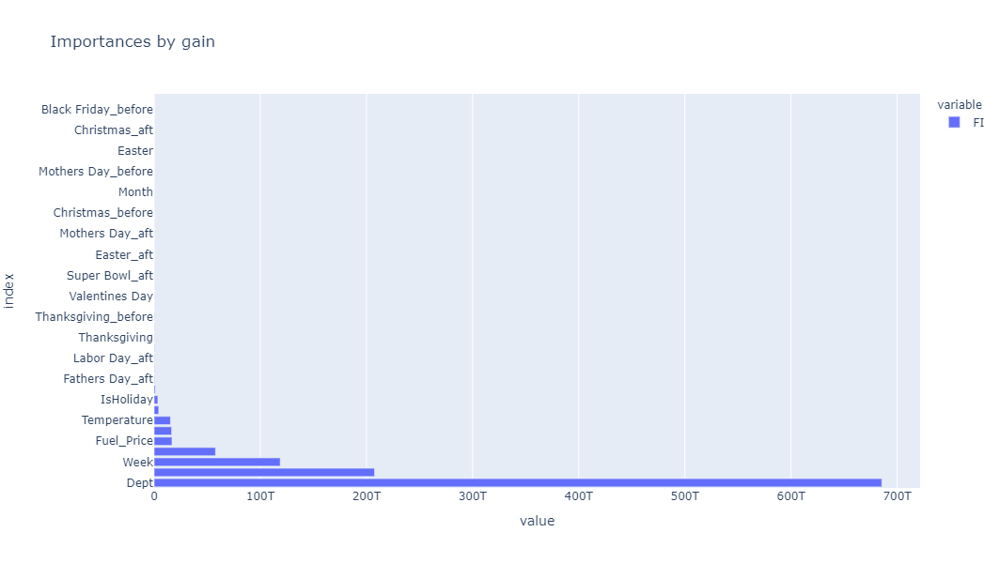

In [216]:
plot_feature_importance(pkl_lgb)

<span style='color:gray; font-family: Verdana'> 
   <ul style='color:gray; font-family: Verdana'>
    <li>As seen on the charts that were made above about stores and departments, that is a big differente in sales for some of them and that might have helped to make it important. </li>
        <li> Also a variable like week is very important too and that because as said above the number of the week can diferentiate high and low sales periods.</li>
                <li>As expected the holiday variables did not get so much importance, it was expected becuase variables like week can already explain them.</li>
    </ul>
<span>

<span style='color:#0071dc; font-family: Verdana'> Random Search for hyperparameters tuning for the RandomForest<span>

In [138]:
n_estimators = [50,150]
max_depth = [None]+[int(x) for x in range(2, 15, 3)]
max_features = [i/10 for i in range(4, 9, 1)]

random_grid = {
'n_estimators': n_estimators,
'max_depth': max_depth,
'max_features' : max_features,
}

In [139]:
df_results_cv_rf=models_with_tuning_evaluation(dict_models['rf'],random_grid,X_train,y_train,X_test,y_test,X_train_weights,X_test_weights)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV 1/3; 1/30] START max_depth=8, max_features=0.6, n_estimators=150............
[CV 1/3; 1/30] END max_depth=8, max_features=0.6, n_estimators=150;, score=(train=4066.382, test=5746.203) total time=  24.7s
[CV 2/3; 1/30] START max_depth=8, max_features=0.6, n_estimators=150............
[CV 2/3; 1/30] END max_depth=8, max_features=0.6, n_estimators=150;, score=(train=4245.648, test=5197.467) total time=  20.0s
[CV 3/3; 1/30] START max_depth=8, max_features=0.6, n_estimators=150............
[CV 3/3; 1/30] END max_depth=8, max_features=0.6, n_estimators=150;, score=(train=4322.130, test=6096.947) total time=  20.6s
[CV 1/3; 2/30] START max_depth=11, max_features=0.5, n_estimators=50............
[CV 1/3; 2/30] END max_depth=11, max_features=0.5, n_estimators=50;, score=(train=3017.329, test=5442.609) total time=   8.1s
[CV 2/3; 2/30] START max_depth=11, max_features=0.5, n_estimators=50............
[CV 2/3; 2/30] END max_depth=1

In [143]:
df_results_cv_rf.sort_values("mean_train_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_max_features,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score,Overfit
12,55.344595,0.383898,1.034980,0.047446,150,0.7,None,"{'n_estimators': 150, 'max_features': 0.7, 'ma...",5258.910026,4667.853055,6190.209224,5372.324102,626.652025,24,488.634180,503.348430,603.698358,531.893656,51.127708,0.099006
21,48.503549,0.537432,1.032908,0.047001,150,0.6,None,"{'n_estimators': 150, 'max_features': 0.6, 'ma...",5186.702986,4511.372655,6155.016324,5284.363988,674.558809,28,519.920741,534.851217,639.763638,564.845199,53.324848,0.106890
29,43.292678,0.200508,1.034344,0.047773,150,0.5,None,"{'n_estimators': 150, 'max_features': 0.5, 'ma...",5137.219389,4490.804120,6072.164223,5233.395911,649.159655,29,563.449431,587.495822,694.255673,615.066975,56.848891,0.117527
8,37.485666,0.300960,1.101834,0.000633,150,0.4,None,"{'n_estimators': 150, 'max_features': 0.4, 'ma...",5145.099333,4437.543583,6066.548154,5216.397023,666.946521,30,706.062923,731.337239,855.266510,764.222224,65.199664,0.146504
6,39.481243,0.527519,0.703241,0.001167,150,0.8,14,"{'n_estimators': 150, 'max_features': 0.8, 'ma...",5363.974082,4922.351919,6318.394712,5534.906904,582.607582,16,1458.734438,1474.557742,1770.933847,1568.075342,143.588008,0.283307
2,34.037905,0.195790,0.704902,0.003744,150,0.7,14,"{'n_estimators': 150, 'max_features': 0.7, 'ma...",5310.031547,4785.245198,6240.035786,5445.104177,601.546549,21,1576.527273,1597.324528,1891.311741,1688.387847,143.739838,0.310074
11,29.203275,0.218038,0.699550,0.000391,150,0.6,14,"{'n_estimators': 150, 'max_features': 0.6, 'ma...",5262.846785,4617.165952,6161.461996,5347.158244,633.268708,27,1758.844135,1822.192400,2090.019320,1890.351952,143.535232,0.353525
4,10.562902,0.145340,0.499736,0.001691,50,0.6,14,"{'n_estimators': 50, 'max_features': 0.6, 'max...",5338.449755,4627.279580,6150.584217,5372.104518,622.341673,25,1777.886931,1819.061610,2092.424817,1896.457786,139.585449,0.353020
3,9.273331,0.223181,0.501753,0.003383,50,0.5,14,"{'n_estimators': 50, 'max_features': 0.5, 'max...",5259.297259,4654.089283,6143.767221,5352.384587,611.710186,26,2011.653271,2090.023173,2309.962624,2137.213023,126.272929,0.399301
14,32.200078,0.082080,0.599975,0.000439,150,0.8,11,"{'n_estimators': 150, 'max_features': 0.8, 'ma...",5463.265786,5045.856385,6322.560442,5610.560871,531.516819,13,2437.640135,2523.682806,2800.816201,2587.379714,154.956308,0.461162


In [144]:
df_results_cv_rf.sort_values("mean_train_score").iloc[0].params

{'n_estimators': 150, 'max_features': 0.7, 'max_depth': None}

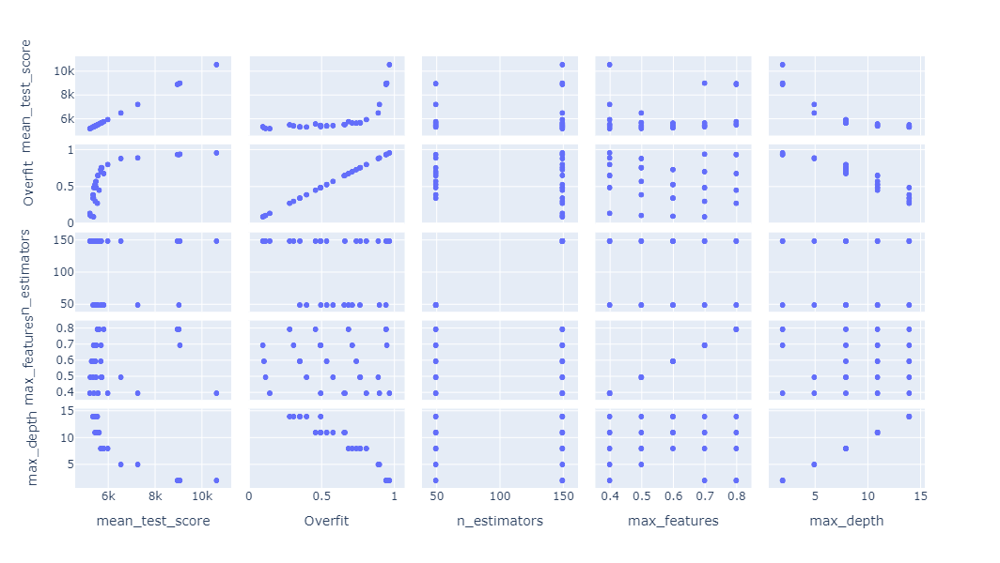

In [145]:
px.scatter_matrix(df_results_cv_rf[['mean_test_score','Overfit']].join(df_results_cv_rf.params.apply(pd.Series)),height=600,width=1100)

<span style='color:gray; font-family: Verdana'> Choosing params that are more correlated to small errors <span>

<span style='color:#0071dc; font-family: Verdana'> Fiting the best overfit x performance model <span>

In [146]:
rf=RandomForestRegressor(random_state=42, n_jobs=-1, n_estimators = 150, max_features = 0.7, max_depth =None) 

In [147]:
pkl_rf=Pipeline([('prep',pipe_prep),('model',rf)])

In [148]:
coldt=pd.to_datetime(X_train_raw.Date)
weightmultiplier=pd.Series((coldt.dt.isocalendar().week==47)|(coldt.dt.isocalendar().week==51)).astype(int)*9+1

In [149]:
pkl_rf.fit(X_train_raw,y_train,**{'model__sample_weight': X_train_weights*weightmultiplier})

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer())]),
                                                  ['Temperature', 'Fuel_Price',
                                                   'Size']),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('store_dept_type',
                                                                   Store_dept_type())]),
                                                  Index(['Store', 'Dept', 'Type'], dtype='object')),
                                                 ('pipeline-3',
                                                  Pipeline(steps=[('date_transformer',
                                                                   Date_Transformer())]),
                  

<span style='color:#0071dc; font-family: Verdana'> Evaluating the model<span>

Train WMAE: 592.3655993843674
Test WMAE: 2130.4450905605795


<AxesSubplot:xlabel='Date'>

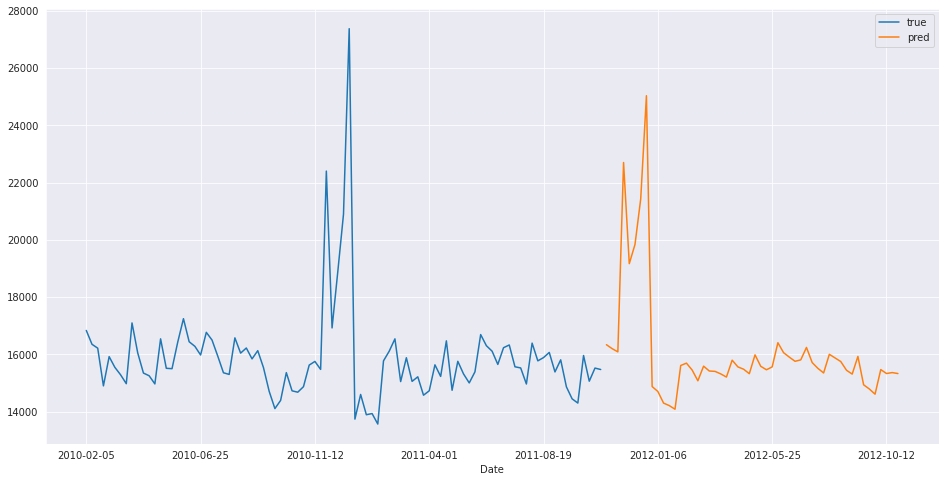

In [150]:
model_evaluator(pkl_rf,'Random Forest')

<span style='color:gray; font-family: Verdana'> <ul style='color:gray; font-family: Verdana'>  Random Forest generally has a little bit more bias then the lgbm and that is the main distinction between boosting and just bagging models like random forest,boosting tends to overfit a little bit more whereas models with just bagging tends to add more bias, which is good sometimes but maybe not too much for the case here because sales are ciclic as seen by the charts and are very similar through their dates in the year. However in both cases it is possible to tune the model parameters to get the results expected.
<span>

<span style='color:#0071dc; font-family: Verdana'> Evaluating the feaures<span>

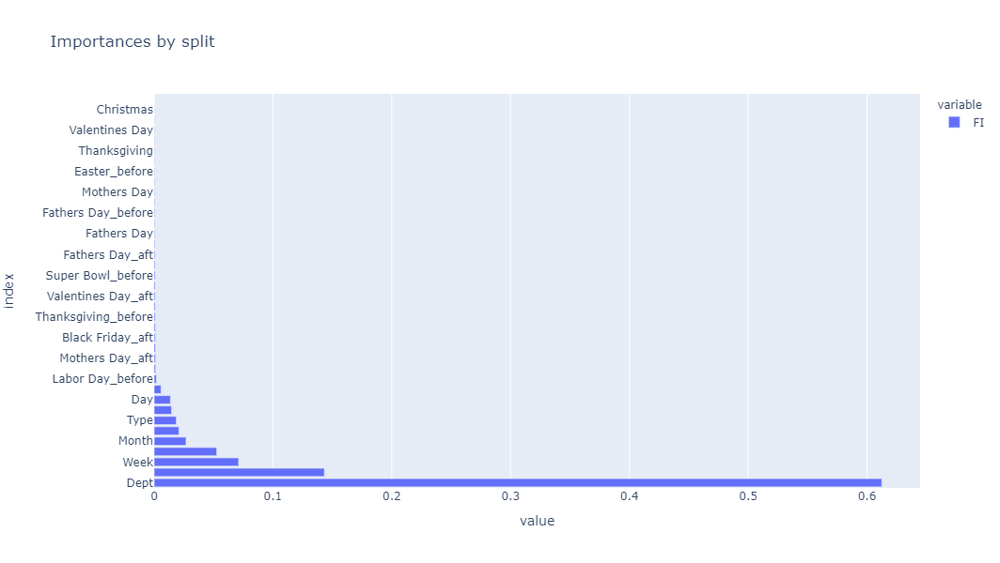

In [151]:
plot_feature_importance(pkl_rf)

<span style='color:gray; font-family: Verdana'> <ul style='color:gray; font-family: Verdana'> The feature importance is very similar to the one from the lgbm so the same comments from the lgbm applies to this one.
<span>

<h2 style='color:#ffc220; font-family: Verdana'> Conclusions</h2>

<span style='color:gray; font-family: Verdana'> <ul style='color:gray; font-family: Verdana'>
    <li>It is a bit hard to tune the parameters for the models because one of them tends to overfit and the other to underfit.</li>
    <li>As expected the parameters of Store and Dept ranked by their sales had the best importances on the model because it actually reflects how high the sales should be by row.</li>
    <li>Also, clearly at some times of the year like at the end, start of the year and at holidays, there are some huge outliers, so using the weights helped a lot to not bias in that times of the year.</li>
    <li>Actually it seems that as the sales are very ciclic it is good to overfit a little the models.</li>
<span>

<h2 style='color:#ffc220; font-family: Verdana'> Final results</h2>

<h3 style='color:#0071dc; font-family: Verdana'> Making predictions to submit </h3>

In [217]:
Xfinal=test

In [218]:
preditos=pkl_lgb.predict(Xfinal)

In [219]:
preditos=pd.Series(preditos)

In [220]:
ids=dict_dfs['test']['Store'].apply(lambda x: str(x)+'_')+dict_dfs['test']['Dept'].apply(lambda x: str(x)+'_')+dict_dfs['test']['Date'].astype(str)

In [221]:
tabela_final=pd.concat([ids,preditos],axis=1)
tabela_final=tabela_final.rename(columns={0:'Id',1:'Weekly_Sales'})

In [222]:
tabela_final

,Id,Weekly_Sales
0,1_1_2012-11-02,36293.120081
1,1_1_2012-11-09,14634.738705
2,1_1_2012-11-16,18564.330014
3,1_1_2012-11-23,22956.115467
4,1_1_2012-11-30,21125.358856
...,...,...
115059,45_98_2013-06-28,-120.405559
115060,45_98_2013-07-05,-357.460488
115061,45_98_2013-07-12,-733.616456
115062,45_98_2013-07-19,-824.550176


In [223]:
tabela_final.to_csv('Reposta_Walmart.csv',index=False)

<h3 style='color:#0071dc; font-family: Verdana'> Final score </h3>

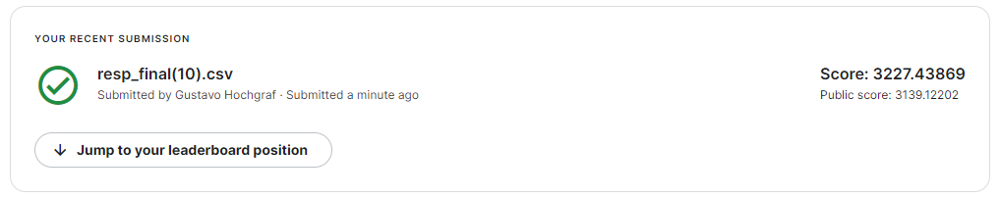